# <font color='blue'>***Paychex Capstone Project***</font>
Authors: "***The A Team***"
  - Lico, Ledion
  - Manly, Isaac
  - Pappas, Jordan
  - Winn, Brian

### <font color='Green'>***README***</font>
  - Google Colab Version (Jupyter notebook version will be submitted separately if possible)
    - ONLINE ONLY

### <font color='Blue'>***TODO (Immediate)***</font>
  - Improve current models and implement new models to compare performance with
  - [Evenutally] Make sure we're calling each prediction dataframe by the model
  - [Eventually] Make sure that we can differentiate between standard X/y train/test from the SMOTE version

  
### <font color='Orange'>***CHANGELOG***</font>
  - ...

### <font color='dark orange'>***NOTES/TALKING POINTS***</font>
  - Do we want to just get rid of the histograms/plots that we found weren't useful?
  - We should probably move mounting Google Drives as a subsection to Load Data, convert current load cell to a subsection, and then add the rest as a 'cleaning' section.
  - ...

# <font color='red'>***Import Packages***</font>

In [ ]:
!pip3 install optuna
!pip install exp

In [ ]:
# cleaning
import math
import numpy as np
import pandas as pd
import os
import random
import statistics as stats
import statsmodels.api as sm
import exp

# visualization
from matplotlib import figure, colors
from matplotlib.patches import Rectangle

import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns

# resampling
import imblearn
from imblearn.over_sampling import SMOTE

# modeling
from sklearn import datasets, linear_model, preprocessing

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import LatentDirichletAllocation as LDA
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold

from sklearn.linear_model import LogisticRegression, Ridge, Lasso
from sklearn import svm
from sklearn.svm import OneClassSVM
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest
from xgboost import XGBClassifier

from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score, roc_curve
from sklearn.metrics import classification_report, confusion_matrix, plot_confusion_matrix

# hyperparameter tuning
import optuna

# misc
from collections import Counter
from datetime import datetime
from google.colab import files
from time import time
from tqdm import tqdm
from tqdm.notebook import tqdm
tqdm.pandas()

# set seed
random.seed(0)
random_state = np.random.RandomState(0)

# <font color='red'>***Load Data***</font>
  - Use line "data = files.upload" to load the initial file (resets on a new runtime)
    - "Restart Runtime" does NOT create a new runtime
    - "Factory Reset Runtime" DOES reset the runtime
    - Starting a runtime from scratch (new browser) DOES reset the runtime
  - Use line "data = pd.read(...)" when using an active runtime
    - The path can be found by clicking on the "Folder" icon on  the LEFT side of the browser
    - Click the 3-dots on the menu
    - Select "COPY PATH" and insert it into the code

### <font color='Blue'>***Mount Google Drive***</font>


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
#cd Shareddrives

In [ ]:
cp /content/drive/MyDrive/Colab\ Notebooks/UofR_DS_Capstone_Paychex_2021.csv .

### <font color='Blue'>***Load From Local File Directory***</font>


In [ ]:
data = files.upload()

Saving UofR_DS_Capstone_Paychex_2021.csv to UofR_DS_Capstone_Paychex_2021.csv


### <font color='Blue'>***Store Data to Dataframe(s)***</font>



In [ ]:
data = pd.read_csv("/content/UofR_DS_Capstone_Paychex_2021.csv")
paychex = data.copy()
paychex

,ID,Target,State,Industry_Code,FedDepFreq,Business_Source,Previous_Method,Payment_Method,Report_Method,CashPRInd,SeasnlInd,Pay_Weekly_pct,Pay_Bi_weekly_pct,Pay_Semi_monthly_pct,Pay_Monthly_pct,Pay_OtherFreq_pct,WageLevel1_pct,WageLevel2_pct,WageLevel3_pct,WageLevel4_pct,WageLevel5_pct,EE_Health_Insurance_pct,EE_MedicalFSA_pct,AvgNbrActiveEEs_Binned,AvgNbrProduct_Binned,AvgNbrPRsProc_Binned,AvgNbrPRsProcBilledItems_Binned,AvgTaxCount_Binned,Avg_AdjRev_Normalized,Avg_ChrgRev_Normalized,Avg_NetRev_Normalized,Max_NetRev_Normalized,Min_NetRev_Normalized,Avg_HealthInsurance_Normalized,Avg_MedicalFSA_Normalized,Avg_Wage_Normalized,Med_Wage_Normalized
0,1,NonPEO,MA,3,Monthly,6,4,1,2,0,0,0.0,0.0,0.0,1.0,0.0,1.00,0.00,0.0,0.0,0.00,0.0,0.0,5,9,1,2,5,0.000,15.306,16.286,9.094,23.474,0.0,0.0,0.000,0.000
1,2,NonPEO,MA,3,Semi-weekly,6,4,1,2,0,0,0.0,1.0,0.0,0.0,0.0,0.70,0.15,0.0,0.0,0.15,0.0,0.0,7,9,4,4,5,0.000,13.935,15.158,12.683,18.421,0.0,0.0,3.401,1.481
2,3,NonPEO,MA,11,Monthly,6,4,1,2,0,0,1.0,0.0,0.0,0.0,0.0,0.50,0.50,0.0,0.0,0.00,0.0,0.0,4,9,4,2,5,0.000,10.450,11.404,7.742,10.633,0.0,0.0,1.641,1.641
3,4,NonPEO,MA,3,Semi-weekly,6,4,1,2,0,0,0.0,1.0,0.0,0.0,0.0,0.65,0.25,0.0,0.1,0.00,0.0,0.0,9,10,4,5,5,0.000,23.765,25.935,17.597,32.678,0.0,0.0,1.688,0.887
4,5,NonPEO,MA,2,Monthly,6,4,2,2,0,1,1.0,0.0,0.0,0.0,0.0,0.25,0.25,0.5,0.0,0.00,0.0,0.0,6,4,4,3,5,54.126,8.555,11.961,7.562,10.254,0.0,0.0,3.131,3.544
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42114,42115,NonPEO,CA,1,Semi-weekly,7,4,1,1,0,0,1.0,0.0,0.0,0.0,0.0,0.00,0.90,0.1,0.0,0.00,0.0,0.0,8,8,5,5,4,0.000,31.516,11.835,7.629,15.171,0.0,0.0,3.116,3.102
42115,42116,NonPEO,TX,1,Semi-weekly,7,4,1,4,0,0,1.0,0.0,0.0,0.0,0.0,0.35,0.65,0.0,0.0,0.00,0.0,0.0,5,5,4,4,2,0.000,20.502,14.406,6.265,22.805,0.0,0.0,2.448,2.763
42116,42117,NonPEO,CA,1,Semi-weekly,7,4,1,3,0,0,0.0,1.0,0.0,0.0,0.0,1.00,0.00,0.0,0.0,0.00,0.0,0.0,2,4,2,1,4,0.000,14.049,5.775,2.629,9.197,0.0,0.0,0.762,0.762
42117,42118,NonPEO,FL,15,Semi-weekly,7,4,1,1,0,0,1.0,0.0,0.0,0.0,0.0,0.75,0.25,0.0,0.0,0.00,0.0,0.0,7,1,4,4,5,0.000,12.033,5.605,2.902,6.155,0.0,0.0,1.366,1.513


In [ ]:
NonPEO = paychex[paychex.Target == 'NonPEO']
PEO_NonMaster = paychex[paychex.Target == 'PEO_NonMaster']
PEO_Master = paychex[paychex.Target == 'PEO_Master']
cols = paychex.columns

In [ ]:
print("NonPEO Count: {}".format(len(NonPEO)))
print("NonMaster Count: {}".format(len(PEO_NonMaster)))
print("Master Count: {}".format(len(PEO_Master)))

NonPEO Count: 40000
NonMaster Count: 1639
Master Count: 480


# <font color='red'>***EDA***</font>


### <font color='Blue'>***Statistics Calculations***</font>


In [ ]:
# Categorical Variables

# Whether the company is a PEO client, PEO Master client, or nota PEO client at all,
target_mode     = stats.mode(paychex['Target'])
target_median   = stats.median(paychex['Target'])
target_list     = [target_mode, target_median]

# What state the company is in
state_mode      = stats.mode(paychex['State'])
state_median    = stats.mode(paychex['State'])
state_list      = [state_mode, state_median]

# What industry the company is in
industry_mode   = stats.mode(paychex['Industry_Code'])
industry_median = stats.mode(paychex['Industry_Code'])
industry_list   = [industry_mode, industry_median]

# How often a company makes federal deposits
deposit_mode    = stats.mode(paychex['FedDepFreq'])
deposit_median  = stats.mode(paychex['FedDepFreq'])
deposit_list    = [deposit_mode, deposit_median]

# How business came to paychex
source_mode     = stats.mode(paychex['Business_Source'])
source_median   = stats.mode(paychex['Business_Source'])
source_list     = [source_mode, source_median]

# How companies made payroll before paychex
previous_mode   = stats.mode(paychex['Previous_Method'])
previous_median = stats.mode(paychex['Previous_Method'])
previous_list   = [previous_mode, previous_median]

# How payroll invoices are paid
payment_mode    = stats.mode(paychex['Payment_Method'])
payment_median  = stats.mode(paychex['Payment_Method'])
payment_list    = [payment_mode, payment_median]

# Method of how payroll is reported
report_mode     = stats.mode(paychex['Report_Method'])
report_median   = stats.mode(paychex['Report_Method'])
report_list     = [report_mode, report_median]

# Indicator if business pays in cash only (1=yes)
cash_mode       = stats.mode(paychex['CashPRInd'])
cash_median     = stats.mode(paychex['CashPRInd'])
cash_list       = [cash_mode, cash_median]

#Seasonal Business Indicator (1=yes)
seasonal_mode   = stats.mode(paychex['SeasnlInd'])
seasonal_median = stats.mode(paychex['SeasnlInd'])
seasonal_list   = [seasonal_mode, seasonal_median]

In [ ]:
stats = [target_list,
         state_list,
         industry_list,
         deposit_list,
         source_list,
         previous_list,
         payment_list,
         report_list,
         cash_list,
         seasonal_list]

indices = ["Target",
           "State",
           "Industry",
           "Federal Deposits",
           "Reference Source",
           "Previous Payroll Method",
           "Type of Payroll Payout",
           "Payroll Reporting Method",
           "Cash Only",
           "Seasonal Business"]

stats_cols = ["Median", "Mode"]

### <font color='Blue'>***Statistics Charts***</font>


In [ ]:
stats_chart = pd.DataFrame(stats,
                           columns = stats_cols,
                           index = indices)
stats_chart

,Median,Mode
Target,NonPEO,NonPEO
State,NY,NY
Industry,1,1
Federal Deposits,Monthly,Monthly
Reference Source,2,2
Previous Payroll Method,1,1
Type of Payroll Payout,1,1
Payroll Reporting Method,1,1
Cash Only,0,0
Seasonal Business,0,0


In [ ]:
# build summary stats table using .describe() method

summary_stats = paychex.describe().transpose()
summary_stats.to_csv('summary stats.csv', sep=',')
summary_stats

,count,mean,std,min,25%,50%,75%,max
ID,42119.0,21060.000000,12158.852331,1.0,10530.500,21060.000,31589.5000,42119.00
Industry_Code,42119.0,5.592678,4.052993,1.0,2.000,5.000,8.0000,16.00
Business_Source,42119.0,3.136328,2.346970,1.0,1.000,2.000,4.0000,10.00
Previous_Method,42119.0,2.548850,1.766091,1.0,1.000,2.000,4.0000,6.00
Payment_Method,42119.0,1.030794,0.172760,1.0,1.000,1.000,1.0000,2.00
Report_Method,42119.0,2.037893,1.190202,1.0,1.000,2.000,3.0000,6.00
CashPRInd,42119.0,0.014412,0.119181,0.0,0.000,0.000,0.0000,1.00
SeasnlInd,42119.0,0.013723,0.116340,0.0,0.000,0.000,0.0000,1.00
Pay_Weekly_pct,42119.0,0.256998,0.434065,0.0,0.000,0.000,0.9000,1.00
Pay_Bi_weekly_pct,42119.0,0.402756,0.486394,0.0,0.000,0.000,1.0000,1.00


In [ ]:
PEO_Master_stats = PEO_Master.describe().transpose()
PEO_Master_stats

,count,mean,std,min,25%,50%,75%,max
ID,480.0,32279.050000,11686.778259,7143.0,37184.75000,37505.000,37977.50000,38734.000
Industry_Code,480.0,6.079167,3.841590,1.0,3.00000,5.000,9.00000,16.000
Business_Source,480.0,4.102083,2.275401,1.0,2.00000,4.000,4.00000,10.000
Previous_Method,480.0,3.391667,1.572445,1.0,2.00000,4.000,4.00000,6.000
Payment_Method,480.0,1.004167,0.064482,1.0,1.00000,1.000,1.00000,2.000
Report_Method,480.0,1.983333,1.388791,1.0,1.00000,1.000,3.00000,6.000
CashPRInd,480.0,0.000000,0.000000,0.0,0.00000,0.000,0.00000,0.000
SeasnlInd,480.0,0.000000,0.000000,0.0,0.00000,0.000,0.00000,0.000
Pay_Weekly_pct,480.0,0.140729,0.346067,0.0,0.00000,0.000,0.00000,1.000
Pay_Bi_weekly_pct,480.0,0.458125,0.496613,0.0,0.00000,0.000,1.00000,1.000


In [ ]:
PEO_NonMaster_stats = PEO_NonMaster.describe().transpose()
PEO_NonMaster_stats

,count,mean,std,min,25%,50%,75%,max
ID,1639.0,33864.516168,10345.472936,7142.0,37143.5000,37761.000,38274.5000,41582.000
Industry_Code,1639.0,6.308115,3.825673,1.0,3.0000,6.000,9.0000,16.000
Business_Source,1639.0,4.062233,2.243924,1.0,2.0000,4.000,4.0000,10.000
Previous_Method,1639.0,3.478340,1.610592,1.0,2.0000,4.000,4.0000,6.000
Payment_Method,1639.0,1.001830,0.042757,1.0,1.0000,1.000,1.0000,2.000
Report_Method,1639.0,1.927395,1.393855,1.0,1.0000,1.000,3.0000,6.000
CashPRInd,1639.0,0.000000,0.000000,0.0,0.0000,0.000,0.0000,0.000
SeasnlInd,1639.0,0.000000,0.000000,0.0,0.0000,0.000,0.0000,0.000
Pay_Weekly_pct,1639.0,0.320622,0.465162,0.0,0.0000,0.000,1.0000,1.000
Pay_Bi_weekly_pct,1639.0,0.437889,0.494313,0.0,0.0000,0.000,1.0000,1.000


In [ ]:
NonPeo_stats = NonPEO.describe().transpose()
NonPeo_stats

,count,mean,std,min,25%,50%,75%,max
ID,40000.0,20400.706350,11873.823329,1.0,10301.75000,20301.5000,30301.25000,42119.000
Industry_Code,40000.0,5.557525,4.061509,1.0,2.00000,4.0000,8.00000,16.000
Business_Source,40000.0,3.086800,2.341603,1.0,1.00000,2.0000,4.00000,10.000
Previous_Method,40000.0,2.500650,1.761314,1.0,1.00000,2.0000,4.00000,6.000
Payment_Method,40000.0,1.032300,0.176798,1.0,1.00000,1.0000,1.00000,2.000
Report_Method,40000.0,2.043075,1.178306,1.0,1.00000,2.0000,3.00000,6.000
CashPRInd,40000.0,0.015175,0.122250,0.0,0.00000,0.0000,0.00000,1.000
SeasnlInd,40000.0,0.014450,0.119338,0.0,0.00000,0.0000,0.00000,1.000
Pay_Weekly_pct,40000.0,0.255786,0.433324,0.0,0.00000,0.0000,0.85000,1.000
Pay_Bi_weekly_pct,40000.0,0.400653,0.485861,0.0,0.00000,0.0000,1.00000,1.000


In [ ]:
PEO_Master_stats - PEO_NonMaster_stats

,count,mean,std,min,25%,50%,75%,max
ID,-1159.0,-1585.466168,1341.305323,1.0,41.25000,-256.000,-297.00000,-2848.000
Industry_Code,-1159.0,-0.228948,0.015916,0.0,0.00000,-1.000,0.00000,0.000
Business_Source,-1159.0,0.039850,0.031476,0.0,0.00000,0.000,0.00000,0.000
Previous_Method,-1159.0,-0.086674,-0.038147,0.0,0.00000,0.000,0.00000,0.000
Payment_Method,-1159.0,0.002336,0.021725,0.0,0.00000,0.000,0.00000,0.000
Report_Method,-1159.0,0.055939,-0.005064,0.0,0.00000,0.000,0.00000,0.000
CashPRInd,-1159.0,0.000000,0.000000,0.0,0.00000,0.000,0.00000,0.000
SeasnlInd,-1159.0,0.000000,0.000000,0.0,0.00000,0.000,0.00000,0.000
Pay_Weekly_pct,-1159.0,-0.179893,-0.119095,0.0,0.00000,0.000,-1.00000,0.000
Pay_Bi_weekly_pct,-1159.0,0.020236,0.002301,0.0,0.00000,0.000,0.00000,0.000


### <font color='Blue'>***Graphs***</font>

##### Helper Functions

In [ ]:
cnames = {
'aqua':                 '#00FFFF',
'aquamarine':           '#7FFFD4',
'black':                '#000000',
'blue':                 '#0000FF',
'blueviolet':           '#8A2BE2',
'brown':                '#A52A2A',
'cadetblue':            '#5F9EA0',
'chocolate':            '#D2691E',
'crimson':              '#DC143C',
'cyan':                 '#00FFFF',
'darkblue':             '#00008B',
'darkcyan':             '#008B8B',
'darkgray':             '#A9A9A9',
'darkgreen':            '#006400',
'darkmagenta':          '#8B008B',
'darkorange':           '#FF8C00',
'darkred':              '#8B0000',
'darkturquoise':        '#00CED1',
'forestgreen':          '#228B22',
'gold':                 '#FFD700',
'goldenrod':            '#DAA520',
'gray':                 '#808080',
'green':                '#008000',
'greenyellow':          '#ADFF2F',
'indigo':               '#4B0082',
'lawngreen':            '#7CFC00',
'lime':                 '#00FF00',
'limegreen':            '#32CD32',
'magenta':              '#FF00FF',
'maroon':               '#800000',
'midnightblue':         '#191970',
'navy':                 '#000080',
'olive':                '#808000',
'olivedrab':            '#6B8E23',
'orange':               '#FFA500',
'orangered':            '#FF4500',
'pink':                 '#FFC0CB',
'purple':               '#800080',
'red':                  '#FF0000',
'royalblue':            '#4169E1',
'saddlebrown':          '#8B4513',
'salmon':               '#FA8072',
'sandybrown':           '#FAA460',
'seagreen':             '#2E8B57',
'slategray':            '#708090',
'teal':                 '#008080',
'turquoise':            '#40E0D0',
'violet':               '#EE82EE',
'yellow':               '#FFFF00',
'yellowgreen':          '#9ACD32'}

def random_color():
  return random.choice(list(cnames.keys()))

In [ ]:
# Used Official State Colors
  # Obtained from https://en.wikipedia.org/wiki/List_of_U.S._state_colors
  # Use primary color on state flag if unprovided
  # If consecutive states have similar colors, a secondary color is used

full_states = np.unique(paychex['State'], return_counts=False)

state_colors = ['red',    'navy',   'gold',   'red',    'blue',   'yellow', 'blue',     'red',    'cadetblue',  'orange', 'blue',   
                'purple', 'green',  'yellow', 'red',    'blue',   'orange', 'yellow',   'blue',   'black',      'green',  'blue',
                'purple', 'red',    'blue',   'yellow', 'blue',   'gray',   'yellow',   'blue',   'red',        'navy',   'red',
                'navy',   'red',    'green',  'gold',   'blue',   'yellow', 'darkblue', 'red',    'yellow',     'navy',   'orange',
                'red',    'yellow', 'blue',   'red',    'green',  'yellow', 'blue',     'red']

state_color_list = []
for state in range(len(full_states)):
  state_color_list.append([full_states[state], state_colors[state]])

def get_state_colors(states):
  state_list = []
  for state in range(len(states)):
    for state_color in range(len(state_color_list)):
      if states[state] == state_color_list[state_color][0]:
        state_list.append(state_color_list[state_color][1])
  return state_list

##### Target Histogram and Pie Chart

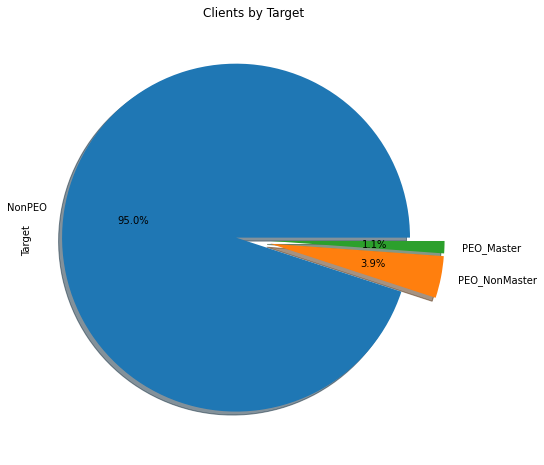

In [ ]:
ax=plt.subplots(1,1,figsize=(10,8))
peo_clients=paychex['Target'].value_counts()
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 50
peo_clients.plot.pie(explode=[0.1,0.1,0.1],autopct='%1.1f%%',shadow=True,figsize=(10,8))
plt.title("Clients by Target")
plt.show()

##### State Histogram

In [ ]:
full_states, full_counts = np.unique(paychex['State'], return_counts=True)
master_states, master_counts = np.unique(PEO_Master.State, return_counts=True)
nonMaster_states, nonMaster_counts = np.unique(PEO_NonMaster.State, return_counts=True)
nonPEO_states, nonPEO_counts = np.unique(PEO_Master.State, return_counts=True)

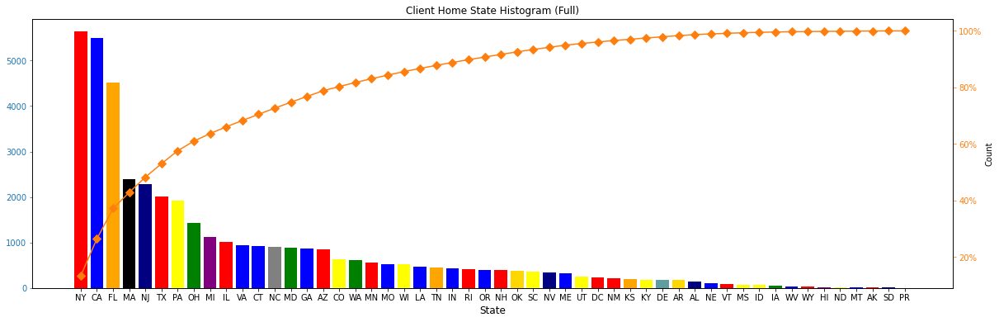

In [ ]:
# Add a Pareto Graph

df2=paychex["State"].value_counts()
df=df2.to_frame(name='country') # country is an arbitrary name, placeholder for state
from matplotlib.ticker import PercentFormatter

df = df.sort_values(by='country',ascending=False)
df["cumpercentage"] = df["country"].cumsum()/df["country"].sum()*100
plt.rcParams["figure.figsize"] = (20,6)

fig, ax = plt.subplots()
ax.bar(df.index, df["country"], color=get_state_colors(list(df.index)))
ax2 = ax.twinx()
ax2.plot(df.index, df["cumpercentage"], color="C1", marker="D", ms=7)
ax2.yaxis.set_major_formatter(PercentFormatter())

ax.tick_params(axis="y", colors="C0")
ax2.tick_params(axis="y", colors="C1")
plt.title("Client Home State Histogram (Full)")
plt.xlabel("State")
ax.set_xlabel("State", fontsize=12)
plt.ylabel("Count")
plt.show()

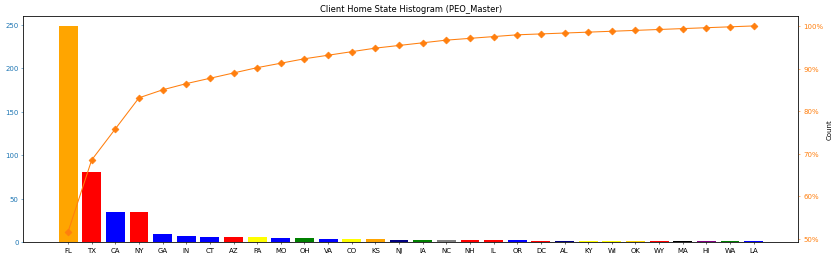

In [ ]:
df2=PEO_Master["State"].value_counts()
df=df2.to_frame(name='State') # Country is an arbitrary name, placeholder for state
from matplotlib.ticker import PercentFormatter

df = df.sort_values(by='State',ascending=False)
df["cumpercentage"] = df["State"].cumsum()/df["State"].sum()*100
plt.rcParams["figure.figsize"] = (20,6)

fig, ax = plt.subplots()
ax.bar(df.index, df["State"], color=get_state_colors(list(df.index)))
ax2 = ax.twinx()
ax2.plot(df.index, df["cumpercentage"], color="C1", marker="D", ms=7)
ax2.yaxis.set_major_formatter(PercentFormatter())

ax.tick_params(axis="y", colors="C0")
ax2.tick_params(axis="y", colors="C1")
plt.title("Client Home State Histogram (PEO_Master)")
plt.xlabel("State")
plt.ylabel("Count")
plt.show()

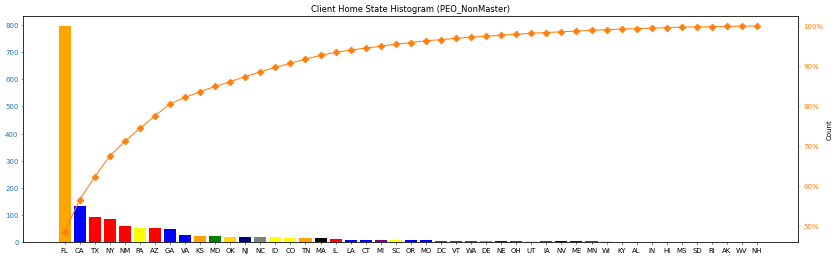

In [ ]:
df2=PEO_NonMaster["State"].value_counts()
df=df2.to_frame(name='State') # Country is an arbitrary name, placeholder for state
from matplotlib.ticker import PercentFormatter

df = df.sort_values(by='State',ascending=False)
df["cumpercentage"] = df["State"].cumsum()/df["State"].sum()*100
plt.rcParams["figure.figsize"] = (20,6)

fig, ax = plt.subplots()
ax.bar(df.index, df["State"], color=get_state_colors(list(df.index)))
ax2 = ax.twinx()
ax2.plot(df.index, df["cumpercentage"], color="C1", marker="D", ms=7)
ax2.yaxis.set_major_formatter(PercentFormatter())

ax.tick_params(axis="y", colors="C0")
ax2.tick_params(axis="y", colors="C1")
plt.title("Client Home State Histogram (PEO_NonMaster)")
plt.xlabel("State")
plt.ylabel("Count")
plt.show()

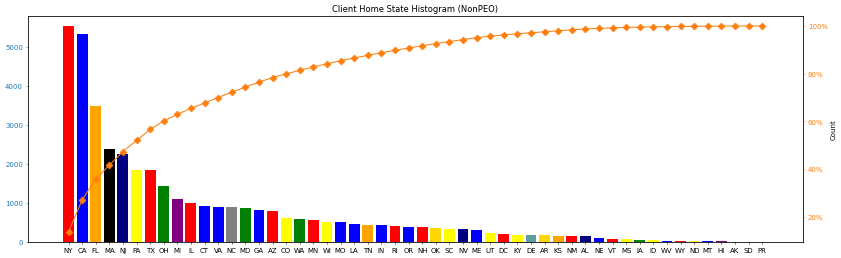

In [ ]:
df2=NonPEO["State"].value_counts()
df=df2.to_frame(name='State') # Country is an arbitrary name, placeholder for state
from matplotlib.ticker import PercentFormatter

df = df.sort_values(by='State',ascending=False)
df["cumpercentage"] = df["State"].cumsum()/df["State"].sum()*100
plt.rcParams["figure.figsize"] = (20,6)

fig, ax = plt.subplots()
ax.bar(df.index, df["State"], color=get_state_colors(list(df.index)))
ax2 = ax.twinx()
ax2.plot(df.index, df["cumpercentage"], color="C1", marker="D", ms=7)
ax2.yaxis.set_major_formatter(PercentFormatter())

ax.tick_params(axis="y", colors="C0")
ax2.tick_params(axis="y", colors="C1")
plt.title("Client Home State Histogram (NonPEO)")
plt.xlabel("State")
plt.ylabel("Count")
plt.show()

##### Heatmaps

In [ ]:
ratiodf = paychex.copy()

states, counts = np.unique(ratiodf.State, return_counts=True)

In [ ]:
PEOs = []
for i in range(len(states)):
  test = ratiodf[ratiodf.State == states[i]]
  test = test[test.Target != 'NonPEO']
 
  PEOs.append(len(test))

In [ ]:
PEOoverNonPEOratio = PEOs/counts

In [ ]:
fig = px.choropleth(locations = states, color = PEOoverNonPEOratio, locationmode = "USA-states", scope = "usa", color_continuous_scale="Viridis")
fig.show()

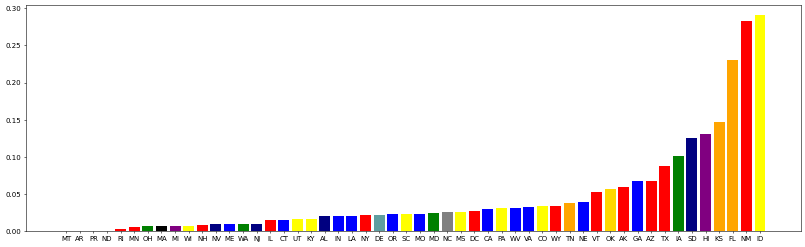

In [ ]:
ratio_histdf = pd.DataFrame(states, PEOoverNonPEOratio, columns = ['State']).reset_index().set_index(states)
ratio_histdf.rename(columns={"index": "Ratio"}, inplace = True)
ratio_histdf = ratio_histdf.sort_values('Ratio')

#ratio_histdf.drop(labels = 'State')
plt.bar(ratio_histdf.index, height = ratio_histdf.Ratio,  color=get_state_colors(list(ratio_histdf.index)))
plt.rcParams["figure.figsize"] = (20,6)
plt.show()

In [ ]:
vizdf = np.unique(paychex.State, return_counts=True)
vizdf
fig = px.choropleth(locations = vizdf[0], color = vizdf[1], locationmode = "USA-states", scope = "usa", color_continuous_scale="Viridis")
fig.show()

In [ ]:
vizdf = np.unique(PEO_Master.State, return_counts=True)
vizdf
fig = px.choropleth(locations = vizdf[0], color = vizdf[1], locationmode = "USA-states", scope = "usa")
fig.show()

In [ ]:
vizdf = np.unique(PEO_NonMaster.State, return_counts=True)
vizdf
fig = px.choropleth(locations = vizdf[0], color = vizdf[1], locationmode = "USA-states", scope = "usa")
fig.show()

In [ ]:
vizdf = np.unique(NonPEO.State, return_counts=True)
vizdf
fig = px.choropleth(locations = vizdf[0], color = vizdf[1], locationmode = "USA-states", scope = "usa")
fig.show()

##### State Takeaways:
- Florida has the most companies in the PEO_Master and greatly PEO_NonMaster target classes, while Texas actually follows in the Master class an California follows in the NonMaster class.
- In the NonPEO target class, New York is the most common class, followed closely by California, and then Florida. As the NonPEO class is the most numerous, it makes sense that the NonPEO graph most closely resembles the graph depicting the total counts.

##### Industry histogram

Text(0, 0.5, 'Count')

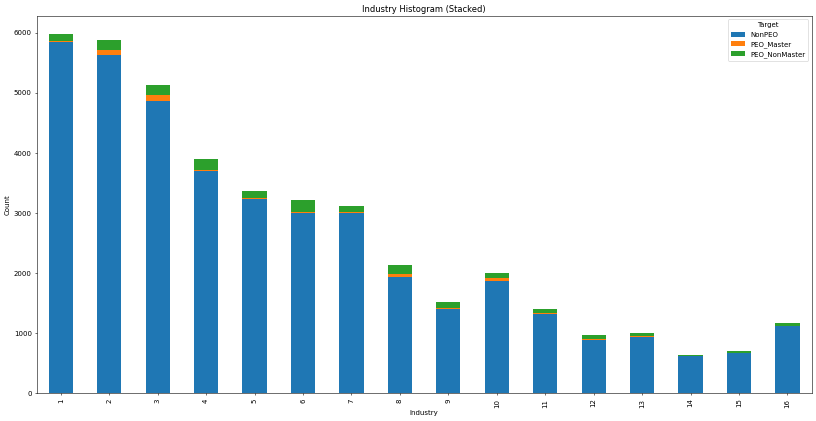

In [ ]:
# Stacked Version
a=paychex.groupby(['Industry_Code','Target']).size()
b=a.unstack(level='Target').plot(kind='bar', stacked=True, figsize=(20, 10))
plt.title("Industry Histogram (Stacked)")
plt.xlabel("Industry")
plt.ylabel("Count")

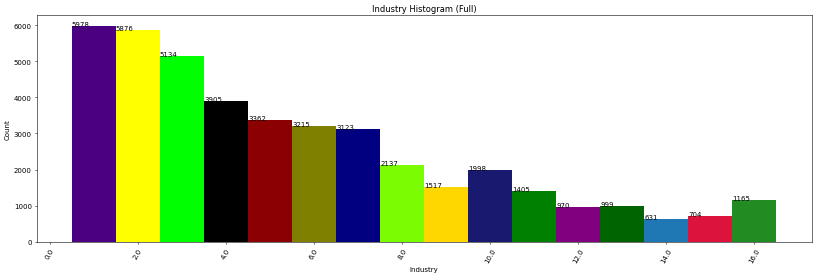

In [ ]:
industries_bins = [ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17]
industry_counts, industry_bins, industry_patches = plt.hist(paychex['Industry_Code'],
                                                            bins = industries_bins, 
                                                            align= 'left')

# Industry colors may be hardcoded once industry-codes are known
colors = []
for i in range(len(industry_counts)):
  color = random_color()
  if color in colors:
    i = i-1
  else:
    colors.append(color)
    industry_patches[i].set_fc(color)

for count, b in zip(industry_counts, industry_bins):
  plt.gca().text(b-.5, count, str(int(count)))

plt.title("Industry Histogram (Full)")
plt.xlabel("Industry")
plt.ylabel("Count")

ax = plt.gca()
ax.set_xticklabels(ax.get_xticks(), rotation = 60)
plt.show()

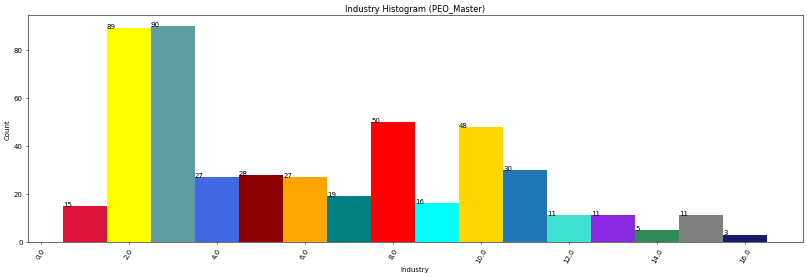

In [ ]:
master_industry_counts, master_industry_bins, master_industry_patches = plt.hist(PEO_Master['Industry_Code'],
                                                                                 bins = industries_bins, 
                                                                                 align= 'left')

# Industry colors may be hardcoded once industry-codes are known
colors = []
for i in range(len(master_industry_counts)):
  color = random_color()
  if color in colors:
    i = i-1
  else:
    colors.append(color)
    master_industry_patches[i].set_fc(color)

for count, b in zip(master_industry_counts, master_industry_bins):
  plt.gca().text(b-.5, count, str(int(count)))

plt.title("Industry Histogram (PEO_Master)")
plt.xlabel("Industry")
plt.ylabel("Count")

ax = plt.gca()
ax.set_xticklabels(ax.get_xticks(), rotation = 60)
plt.show()

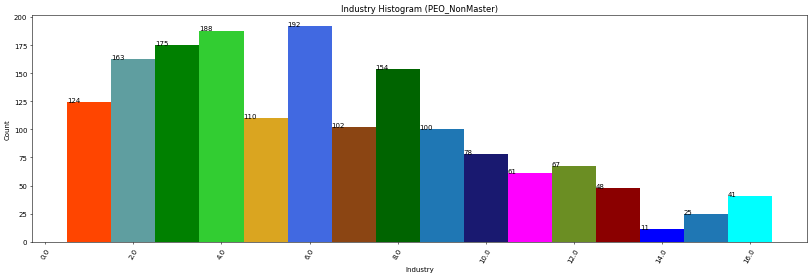

In [ ]:
nonMaster_industry_counts, nonMaster_industry_bins, nonMaster_industry_patches = plt.hist(PEO_NonMaster['Industry_Code'],
                                                                                          bins = industries_bins, 
                                                                                          align= 'left')

# Industry colors may be hardcoded once industry-codes are known
colors = []
for i in range(len(nonMaster_industry_counts)):
  color = random_color()
  if color in colors:
    i = i-1
  else:
    colors.append(color)
    nonMaster_industry_patches[i].set_fc(color)

for count, b in zip(nonMaster_industry_counts, nonMaster_industry_bins):
  plt.gca().text(b-.5, count, str(int(count)))

plt.title("Industry Histogram (PEO_NonMaster)")
plt.xlabel("Industry")
plt.ylabel("Count")

ax = plt.gca()
ax.set_xticklabels(ax.get_xticks(), rotation = 60)
plt.show()

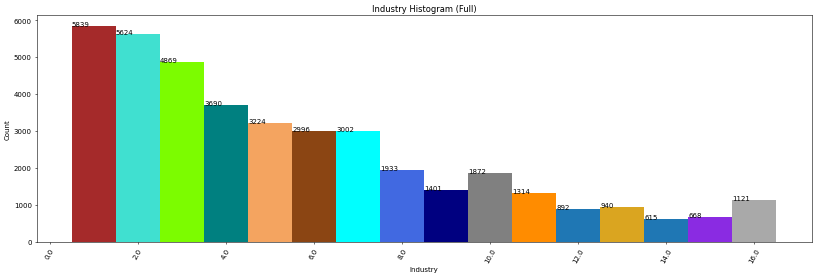

In [ ]:
nonPEO_industry_counts, nonPEO_industry_bins, nonPEO_industry_patches = plt.hist(NonPEO['Industry_Code'],
                                                                                 bins = industries_bins, 
                                                                                 align= 'left')

# Industry colors may be hardcoded once industry-codes are known
colors = []
for i in range(len(nonPEO_industry_counts)):
  color = random_color()
  if color in colors:
    i = i-1
  else:
    colors.append(color)
    nonPEO_industry_patches[i].set_fc(color)

for count, b in zip(nonPEO_industry_counts, nonPEO_industry_bins):
  plt.gca().text(b-.5, count, str(int(count)))

plt.title("Industry Histogram (Full)")
plt.xlabel("Industry")
plt.ylabel("Count")

ax = plt.gca()
ax.set_xticklabels(ax.get_xticks(), rotation = 60)
plt.show()

##### Industry Takeaways:
- Given that Industry Codes 1-6 represent
  - 1: Other Service (Except public administration)
  - 2: Professional Scientific and Technical Services
  - 3: Healthcare
  - 4: Construction
  - 5: Retail/Trade
  - 6: Accomodation/Food Services
    - (Restaraunts, Hotels, etc.)
- It makes sense that the catchall group (1) is the largest. The next is largest is scientific and technical services along with healthcare, which makes sense, in that these are high-paying professions, and would likely provide good benefits. These two groups are the highest in the Master PEO group. The next is construction, which is one of the highest is the general (Non-Master) PEO Class, indicating that a fair amount of construction companies utilize Paychex to provide basic benefits.


##### Tax Agencies Histogram

Text(0, 0.5, 'Count')

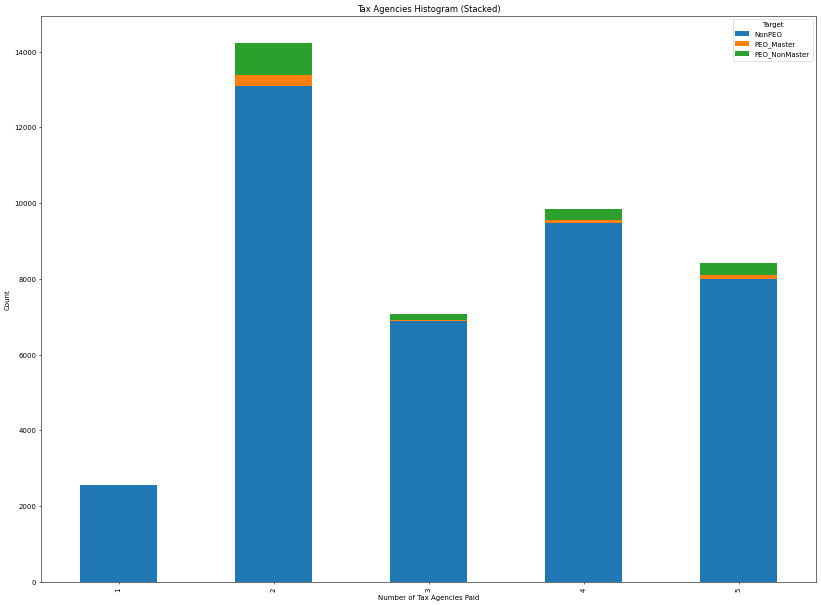

In [ ]:
# Stacked Version Tax Agencies
a=paychex.groupby(['AvgTaxCount_Binned','Target']).size()
b=a.unstack(level='Target').plot(kind='bar', stacked=True, figsize=(20, 15))
plt.title("Tax Agencies Histogram (Stacked)")
plt.xlabel("Number of Tax Agencies Paid")
plt.ylabel("Count")

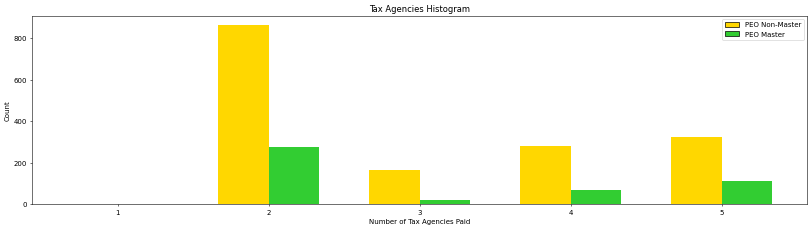

In [ ]:
fig, ax = plt.subplots(figsize=(20, 5))
# Convert to Ratio

master_tax_heights,     master_tax_bins    = np.histogram(PEO_Master['AvgTaxCount_Binned'], bins = [1,2,3,4,5,6])
nonmaster_tax_heights,  nonmaster_tax_bins = np.histogram(PEO_NonMaster['AvgTaxCount_Binned'], bins = [1,2,3,4,5,6])

width = (master_tax_bins[1] - master_tax_bins[0])/3

ax.bar(nonmaster_tax_bins[:-1]-(width*.5),
       nonmaster_tax_heights,
       width=width,
       facecolor='gold')
ax.bar(master_tax_bins[:-1]+(width*.5),
       master_tax_heights,
       width=width,
       facecolor='limegreen')

plt.title("Tax Agencies Histogram")
plt.xlabel("Number of Tax Agencies Paid")
plt.ylabel("Count")

# Legend
colors = ['gold', 'limegreen']
handles = [Rectangle((0, 0), 1, 1, color=c, ec="k") for c in colors]
labels = ["PEO Non-Master", "PEO Master"]
plt.legend(handles, labels)
#seaborn.despine(ax=ax, offset=10)

##### Tax Agencies Takeaways:
- This graph indicates the number of non-federal tax agencies that a company pays taxes to. Initially, it would be suprising that most companies pay two state agencies, one has to remember that some states have more than one tax agency that must be paid to in each payroll. Additionally, there are companies that span multiple states.
- Worth noting is that there are no companies that both use Paychex PEO services and pay more than one tax agencies. These are likely smaller, independent businesses.

##### Average Net Revenue Histogram

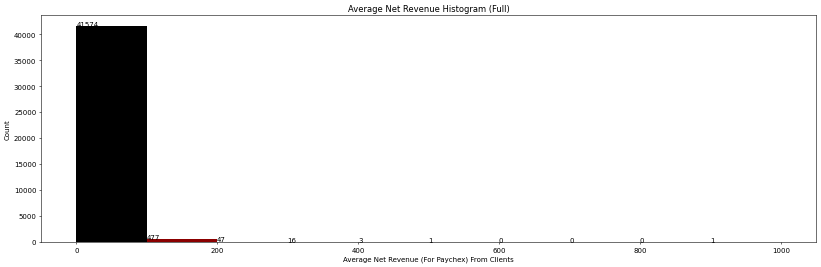

In [ ]:
netRevenue_counts, netRevenue_bins, netRevenue_patches = plt.hist(paychex['Avg_NetRev_Normalized'],
                                                                  bins  = [0,100,200,300,400,500,600,700,800,900,1000],
                                                                  align ='mid')

for i in range(len(netRevenue_counts)):
  colors = ['black', 'darkred', 'firebrick', 'red', 'orangered', 'orange', 'goldenrod', 'yellow', 'yellowgreen', 'green', 'chartreuse']
  netRevenue_patches[i].set_fc(colors[i])

for count, b in zip(netRevenue_counts, netRevenue_bins):
  plt.gca().text(b-.15, count, str(int(count)))

plt.title("Average Net Revenue Histogram (Full)")
plt.xlabel("Average Net Revenue (For Paychex) From Clients")
plt.ylabel("Count")
# plt.xticks([1,2,3,4,5])
plt.show()

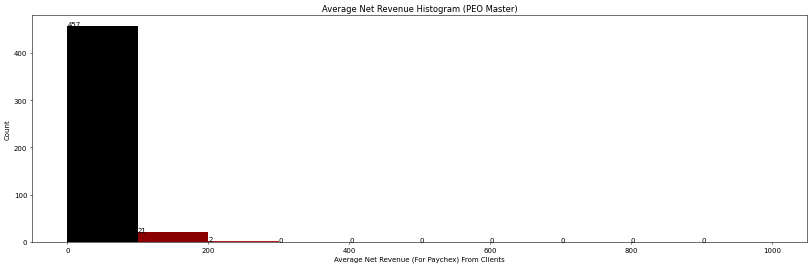

In [ ]:
master_netRevenue_counts, master_netRevenue_bins, master_netRevenue_patches = plt.hist(PEO_Master['Avg_NetRev_Normalized'],
                                                                                       bins  = [0,100,200,300,400,500,600,700,800,900,1000],
                                                                                       align ='mid')

for i in range(len(master_netRevenue_counts)):
  colors = ['black', 'darkred', 'firebrick', 'red', 'orangered', 'orange', 'goldenrod', 'yellow', 'yellowgreen', 'green', 'chartreuse']
  master_netRevenue_patches[i].set_fc(colors[i])

for count, b in zip(master_netRevenue_counts, master_netRevenue_bins):
  plt.gca().text(b-.15, count, str(int(count)))

plt.title("Average Net Revenue Histogram (PEO Master)")
plt.xlabel("Average Net Revenue (For Paychex) From Clients")
plt.ylabel("Count")
# plt.xticks([1,2,3,4,5])
plt.show()

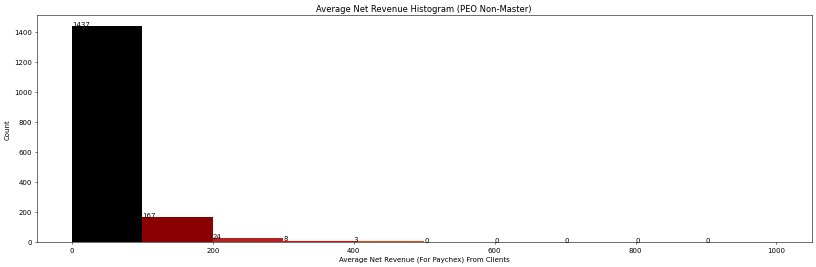

In [ ]:
nonMaster_netRevenue_counts, nonMaster_netRevenue_bins, nonMaster_netRevenue_patches = plt.hist(PEO_NonMaster['Avg_NetRev_Normalized'],
                                                                                                bins  = [0,100,200,300,400,500,600,700,800,900,1000],
                                                                                                align ='mid')

for i in range(len(nonMaster_netRevenue_counts)):
  colors = ['black', 'darkred', 'firebrick', 'red', 'orangered', 'orange', 'goldenrod', 'yellow', 'yellowgreen', 'green', 'chartreuse']
  nonMaster_netRevenue_patches[i].set_fc(colors[i])

for count, b in zip(nonMaster_netRevenue_counts, nonMaster_netRevenue_bins):
  plt.gca().text(b-.15, count, str(int(count)))

plt.title("Average Net Revenue Histogram (PEO Non-Master)")
plt.xlabel("Average Net Revenue (For Paychex) From Clients")
plt.ylabel("Count")
# plt.xticks([1,2,3,4,5])
plt.show()

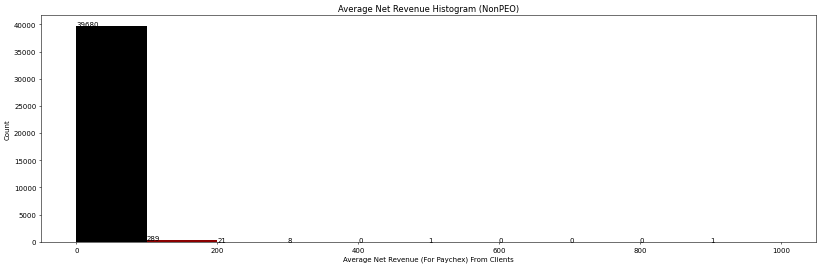

In [ ]:
nonPEO_netRevenue_counts, nonPEO_netRevenue_bins, nonPEO_netRevenue_patches = plt.hist(NonPEO['Avg_NetRev_Normalized'],
                                                                                       bins  = [0,100,200,300,400,500,600,700,800,900,1000],
                                                                                       align ='mid')

for i in range(len(nonPEO_netRevenue_counts)):
  colors = ['black', 'darkred', 'firebrick', 'red', 'orangered', 'orange', 'goldenrod', 'yellow', 'yellowgreen', 'green', 'chartreuse']
  nonPEO_netRevenue_patches[i].set_fc(colors[i])

for count, b in zip(nonPEO_netRevenue_counts, nonPEO_netRevenue_bins):
  plt.gca().text(b-.15, count, str(int(count)))

plt.title("Average Net Revenue Histogram (NonPEO)")
plt.xlabel("Average Net Revenue (For Paychex) From Clients")
plt.ylabel("Count")
# plt.xticks([1,2,3,4,5])
plt.show()

##### Paycycle Histograms

In [ ]:
percent_bins = [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0, 1.05]

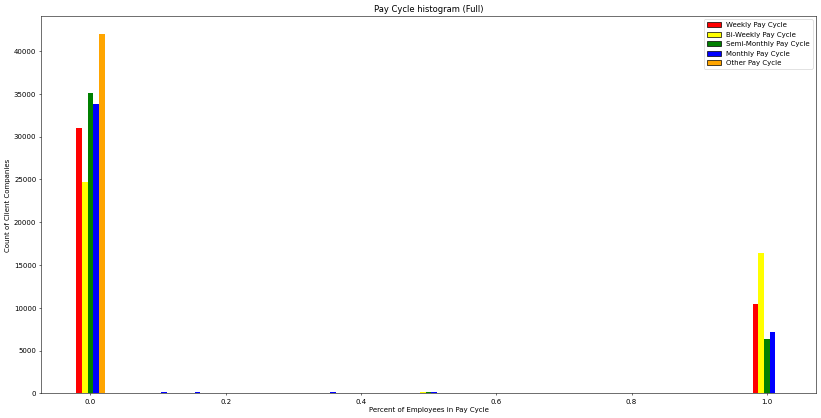

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))

weekly_heights,      weekly_bins      = np.histogram(paychex['Pay_Weekly_pct'], bins = percent_bins)
biweekly_heights,    biweekly_bins    = np.histogram(paychex['Pay_Bi_weekly_pct'], bins = percent_bins)
semiMonthly_heights, semiMonthly_bins = np.histogram(paychex['Pay_Semi_monthly_pct'], bins = percent_bins)
monthly_heights,     monthly_bins     = np.histogram(paychex['Pay_Monthly_pct'], bins = percent_bins)
other_heights,       other_bins       = np.histogram(paychex['Pay_OtherFreq_pct'], bins = percent_bins)

width = (weekly_bins[1] - weekly_bins[0])/6

ax.bar(weekly_bins[:-1]-(width*2),
       weekly_heights,
       width=width,
       facecolor='red')
ax.bar(biweekly_bins[:-1]-width,
       biweekly_heights,
       width=width,
       facecolor='yellow')
ax.bar(semiMonthly_bins[:-1], 
       semiMonthly_heights,
       width=width,
       facecolor='green')
ax.bar(monthly_bins[:-1]+width,
       monthly_heights,
       width=width,
       facecolor='blue')
ax.bar(other_bins[:-1]+(width*2),
       other_heights,
       width=width,
       facecolor='orange')

plt.title("Pay Cycle histogram (Full)")
plt.xlabel("Percent of Employees in Pay Cycle")
plt.ylabel("Count of Client Companies")

colors = ['red', 'yellow', 'green', 'blue', 'orange']
handles = [Rectangle((0, 0), 1, 1, color=c, ec="k") for c in colors]
labels = ["Weekly Pay Cycle", "Bi-Weekly Pay Cycle", "Semi-Monthly Pay Cycle", "Monthly Pay Cycle", "Other Pay Cycle"]
plt.legend(handles, labels)
#seaborn.despine(ax=ax, offset=10)

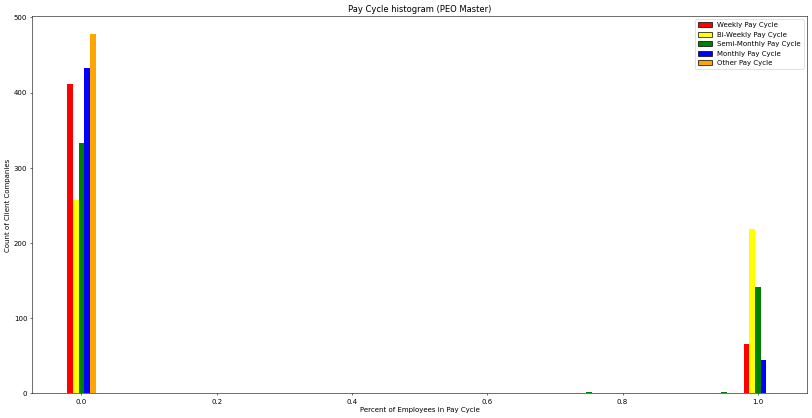

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))

master_weekly_heights,      master_weekly_bins      = np.histogram(PEO_Master['Pay_Weekly_pct'], bins = percent_bins)
master_biweekly_heights,    master_biweekly_bins    = np.histogram(PEO_Master['Pay_Bi_weekly_pct'], bins = percent_bins)
master_semiMonthly_heights, master_semiMonthly_bins = np.histogram(PEO_Master['Pay_Semi_monthly_pct'], bins = percent_bins)
master_monthly_heights,     master_monthly_bins     = np.histogram(PEO_Master['Pay_Monthly_pct'], bins = percent_bins)
master_other_heights,       master_other_bins       = np.histogram(PEO_Master['Pay_OtherFreq_pct'], bins = percent_bins)

width = (master_weekly_bins[1] - master_weekly_bins[0])/6

ax.bar(master_weekly_bins[:-1]-(width*2),
       master_weekly_heights,
       width=width,
       facecolor='red')
ax.bar(master_biweekly_bins[:-1]-width,
       master_biweekly_heights,
       width=width,
       facecolor='yellow')
ax.bar(master_semiMonthly_bins[:-1], 
       master_semiMonthly_heights,
       width=width,
       facecolor='green')
ax.bar(master_monthly_bins[:-1]+width,
       master_monthly_heights,
       width=width,
       facecolor='blue')
ax.bar(master_other_bins[:-1]+(width*2),
       master_other_heights,
       width=width,
       facecolor='orange')

plt.title("Pay Cycle histogram (PEO Master)")
plt.xlabel("Percent of Employees in Pay Cycle")
plt.ylabel("Count of Client Companies")

plt.legend(handles, labels)
#seaborn.despine(ax=ax, offset=10)

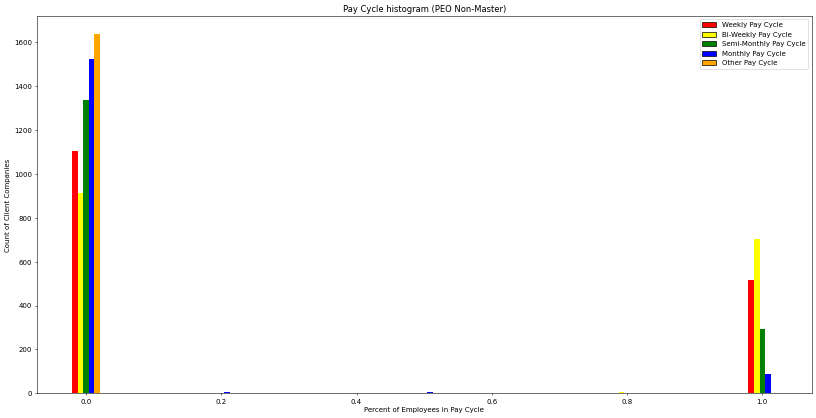

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))

non_Master_weekly_heights,      non_Master_weekly_bins      = np.histogram(PEO_NonMaster['Pay_Weekly_pct'], bins = percent_bins)
non_Master_biweekly_heights,    non_Master_biweekly_bins    = np.histogram(PEO_NonMaster['Pay_Bi_weekly_pct'], bins = percent_bins)
non_Master_semiMonthly_heights, non_Master_semiMonthly_bins = np.histogram(PEO_NonMaster['Pay_Semi_monthly_pct'], bins = percent_bins)
non_Master_monthly_heights,     non_Master_monthly_bins     = np.histogram(PEO_NonMaster['Pay_Monthly_pct'], bins = percent_bins)
non_Master_other_heights,       non_Master_other_bins       = np.histogram(PEO_NonMaster['Pay_OtherFreq_pct'], bins = percent_bins)

width = (weekly_bins[1] - weekly_bins[0])/6

ax.bar(non_Master_weekly_bins[:-1]-(width*2),
       non_Master_weekly_heights,
       width=width,
       facecolor='red')
ax.bar(non_Master_biweekly_bins[:-1]-width,
       non_Master_biweekly_heights,
       width=width,
       facecolor='yellow')
ax.bar(non_Master_semiMonthly_bins[:-1], 
       non_Master_semiMonthly_heights,
       width=width,
       facecolor='green')
ax.bar(non_Master_monthly_bins[:-1]+width,
       non_Master_monthly_heights,
       width=width,
       facecolor='blue')
ax.bar(non_Master_other_bins[:-1]+(width*2),
       non_Master_other_heights,
       width=width,
       facecolor='orange')

plt.title("Pay Cycle histogram (PEO Non-Master)")
plt.xlabel("Percent of Employees in Pay Cycle")
plt.ylabel("Count of Client Companies")

plt.legend(handles, labels)
#seaborn.despine(ax=ax, offset=10)

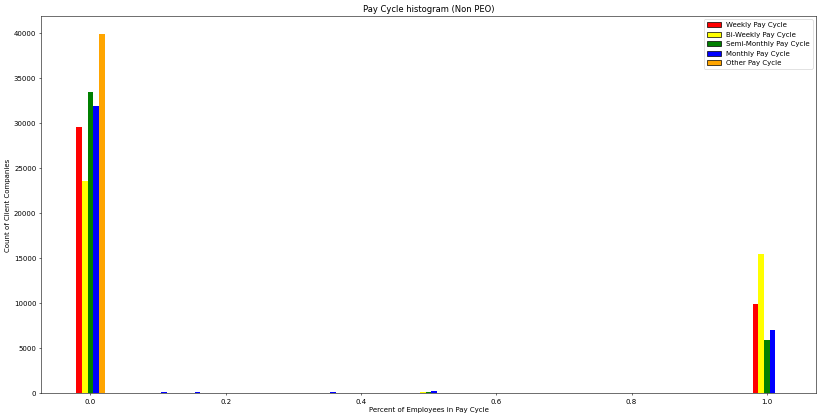

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))

nonPEO_weekly_heights,      nonPEO_weekly_bins      = np.histogram(NonPEO['Pay_Weekly_pct'], bins = percent_bins)
nonPEO_biweekly_heights,    nonPEO_biweekly_bins    = np.histogram(NonPEO['Pay_Bi_weekly_pct'], bins = percent_bins)
nonPEO_semiMonthly_heights, nonPEO_semiMonthly_bins = np.histogram(NonPEO['Pay_Semi_monthly_pct'], bins = percent_bins)
nonPEO_monthly_heights,     nonPEO_monthly_bins     = np.histogram(NonPEO['Pay_Monthly_pct'], bins = percent_bins)
nonPEO_other_heights,       nonPEO_other_bins       = np.histogram(NonPEO['Pay_OtherFreq_pct'], bins = percent_bins)

width = (weekly_bins[1] - weekly_bins[0])/6

ax.bar(nonPEO_weekly_bins[:-1]-(width*2),
       nonPEO_weekly_heights,
       width=width,
       facecolor='red')
ax.bar(nonPEO_biweekly_bins[:-1]-width,
       nonPEO_biweekly_heights,
       width=width,
       facecolor='yellow')
ax.bar(nonPEO_semiMonthly_bins[:-1], 
       nonPEO_semiMonthly_heights,
       width=width,
       facecolor='green')
ax.bar(nonPEO_monthly_bins[:-1]+width,
       nonPEO_monthly_heights,
       width=width,
       facecolor='blue')
ax.bar(nonPEO_other_bins[:-1]+(width*2),
       nonPEO_other_heights,
       width=width,
       facecolor='orange')

plt.title("Pay Cycle histogram (Non PEO)")
plt.xlabel("Percent of Employees in Pay Cycle")
plt.ylabel("Count of Client Companies")

colors = ['red', 'yellow', 'green', 'blue', 'orange']
handles = [Rectangle((0, 0), 1, 1, color=c, ec="k") for c in colors]
labels = ["Weekly Pay Cycle", "Bi-Weekly Pay Cycle", "Semi-Monthly Pay Cycle", "Monthly Pay Cycle", "Other Pay Cycle"]
plt.legend(handles, labels)
#seaborn.despine(ax=ax, offset=10)

##### Wage Groups

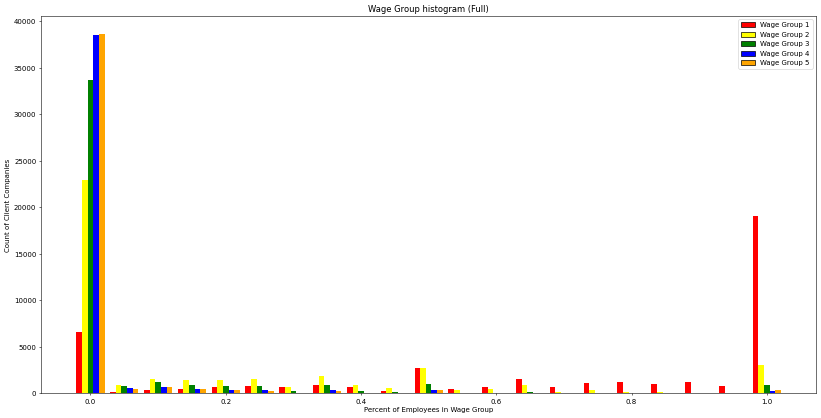

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))

Wage1_heights, Wage1_bins = np.histogram(paychex['WageLevel1_pct'], bins = percent_bins)
Wage2_heights, Wage2_bins = np.histogram(paychex['WageLevel2_pct'], bins = percent_bins)
Wage3_heights, Wage3_bins = np.histogram(paychex['WageLevel3_pct'], bins = percent_bins)
Wage4_heights, Wage4_bins = np.histogram(paychex['WageLevel4_pct'], bins = percent_bins)
Wage5_heights, Wage5_bins = np.histogram(paychex['WageLevel5_pct'], bins = percent_bins)

width = (Wage1_bins[1] - Wage1_bins[0])/6

ax.bar(Wage1_bins[:-1]-(width*2),
       Wage1_heights,
       width=width,
       facecolor='red')
ax.bar(Wage2_bins[:-1]-width,
       Wage2_heights,
       width=width,
       facecolor='yellow')
ax.bar(Wage3_bins[:-1],
       Wage3_heights,
       width=width,
       facecolor='green')
ax.bar(Wage4_bins[:-1]+width,
       Wage4_heights,
       width=width,
       facecolor='blue')
ax.bar(Wage5_bins[:-1]+(width*2),
       Wage5_heights,
       width=width,
       facecolor='orange')

plt.title("Wage Group histogram (Full)")
plt.xlabel("Percent of Employees in Wage Group")
plt.ylabel("Count of Client Companies")

colors = ['red', 'yellow', 'green', 'blue', 'orange']
handles = [Rectangle((0, 0), 1, 1, color=c, ec="k") for c in colors]
labels = ["Wage Group 1", "Wage Group 2", "Wage Group 3", "Wage Group 4", "Wage Group 5"]
plt.legend(handles, labels)
#seaborn.despine(ax=ax, offset=10)

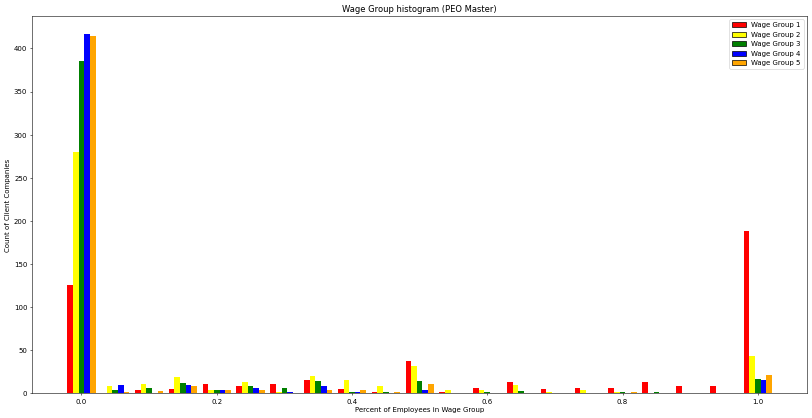

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))

master_Wage1_heights, master_Wage1_bins = np.histogram(PEO_Master['WageLevel1_pct'], bins = percent_bins)
master_Wage2_heights, master_Wage2_bins = np.histogram(PEO_Master['WageLevel2_pct'], bins = percent_bins)
master_Wage3_heights, master_Wage3_bins = np.histogram(PEO_Master['WageLevel3_pct'], bins = percent_bins)
master_Wage4_heights, master_Wage4_bins = np.histogram(PEO_Master['WageLevel4_pct'], bins = percent_bins)
master_Wage5_heights, master_Wage5_bins = np.histogram(PEO_Master['WageLevel5_pct'], bins = percent_bins)

width = (master_Wage1_bins[1] - master_Wage1_bins[0])/6

ax.bar(master_Wage1_bins[:-1]-(width*2),
       master_Wage1_heights,
       width=width,
       facecolor='red')
ax.bar(master_Wage2_bins[:-1]-width,
       master_Wage2_heights,
       width=width,
       facecolor='yellow')
ax.bar(master_Wage3_bins[:-1],
       master_Wage3_heights,
       width=width,
       facecolor='green')
ax.bar(master_Wage4_bins[:-1]+width,
       master_Wage4_heights,
       width=width,
       facecolor='blue')
ax.bar(master_Wage5_bins[:-1]+(width*2),
       master_Wage5_heights,
       width=width,
       facecolor='orange')

plt.title("Wage Group histogram (PEO Master)")
plt.xlabel("Percent of Employees in Wage Group")
plt.ylabel("Count of Client Companies")


plt.legend(handles, labels)
#seaborn.despine(ax=ax, offset=10)

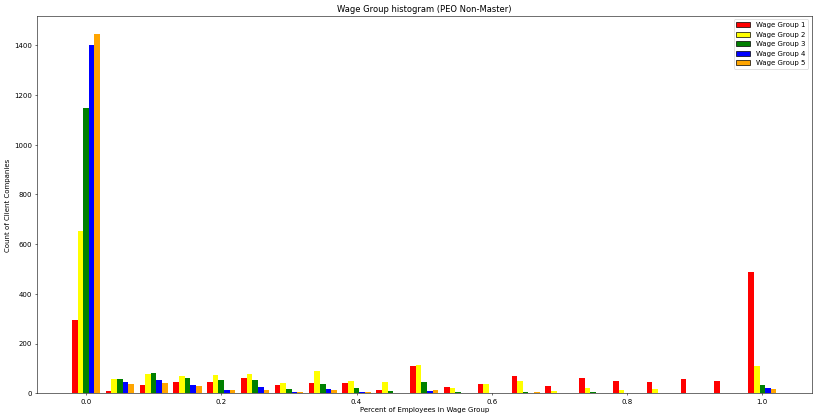

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))

nonMaster_Wage1_heights, nonMaster_Wage1_bins = np.histogram(PEO_NonMaster['WageLevel1_pct'], bins = percent_bins)
nonMaster_Wage2_heights, nonMaster_Wage2_bins = np.histogram(PEO_NonMaster['WageLevel2_pct'], bins = percent_bins)
nonMaster_Wage3_heights, nonMaster_Wage3_bins = np.histogram(PEO_NonMaster['WageLevel3_pct'], bins = percent_bins)
nonMaster_Wage4_heights, nonMaster_Wage4_bins = np.histogram(PEO_NonMaster['WageLevel4_pct'], bins = percent_bins)
nonMaster_Wage5_heights, nonMaster_Wage5_bins = np.histogram(PEO_NonMaster['WageLevel5_pct'], bins = percent_bins)

width = (nonMaster_Wage1_bins[1] - nonMaster_Wage1_bins[0])/6

ax.bar(nonMaster_Wage1_bins[:-1]-(width*2),
       nonMaster_Wage1_heights,
       width=width,
       facecolor='red')
ax.bar(nonMaster_Wage2_bins[:-1]-width,
       nonMaster_Wage2_heights,
       width=width,
       facecolor='yellow')
ax.bar(nonMaster_Wage3_bins[:-1],
       nonMaster_Wage3_heights,
       width=width,
       facecolor='green')
ax.bar(nonMaster_Wage4_bins[:-1]+width,
       nonMaster_Wage4_heights,
       width=width,
       facecolor='blue')
ax.bar(nonMaster_Wage5_bins[:-1]+(width*2),
       nonMaster_Wage5_heights,
       width=width,
       facecolor='orange')

plt.title("Wage Group histogram (PEO Non-Master)")
plt.xlabel("Percent of Employees in Wage Group")
plt.ylabel("Count of Client Companies")


plt.legend(handles, labels)
#seaborn.despine(ax=ax, offset=10)

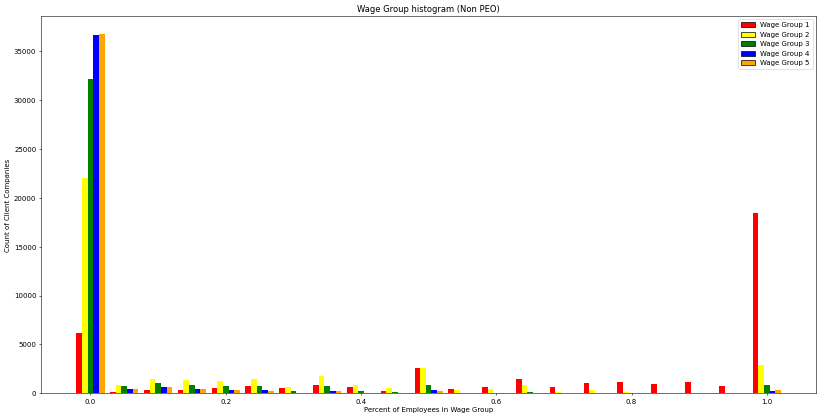

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))

nonPEO_Wage1_heights, nonPEO_Wage1_bins = np.histogram(NonPEO['WageLevel1_pct'], bins = percent_bins)
nonPEO_Wage2_heights, nonPEO_Wage2_bins = np.histogram(NonPEO['WageLevel2_pct'], bins = percent_bins)
nonPEO_Wage3_heights, nonPEO_Wage3_bins = np.histogram(NonPEO['WageLevel3_pct'], bins = percent_bins)
nonPEO_Wage4_heights, nonPEO_Wage4_bins = np.histogram(NonPEO['WageLevel4_pct'], bins = percent_bins)
nonPEO_Wage5_heights, nonPEO_Wage5_bins = np.histogram(NonPEO['WageLevel5_pct'], bins = percent_bins)

width = (nonPEO_Wage1_bins[1] - nonPEO_Wage1_bins[0])/6

ax.bar(nonPEO_Wage1_bins[:-1]-(width*2),
       nonPEO_Wage1_heights,
       width=width,
       facecolor='red')
ax.bar(nonPEO_Wage2_bins[:-1]-width,
       nonPEO_Wage2_heights,
       width=width,
       facecolor='yellow')
ax.bar(nonPEO_Wage3_bins[:-1],
       nonPEO_Wage3_heights,
       width=width,
       facecolor='green')
ax.bar(nonPEO_Wage4_bins[:-1]+width,
       nonPEO_Wage4_heights,
       width=width,
       facecolor='blue')
ax.bar(nonPEO_Wage5_bins[:-1]+(width*2),
       nonPEO_Wage5_heights,
       width=width,
       facecolor='orange')

plt.title("Wage Group histogram (Non PEO)")
plt.xlabel("Percent of Employees in Wage Group")
plt.ylabel("Count of Client Companies")


plt.legend(handles, labels)
#seaborn.despine(ax=ax, offset=10)

In [ ]:
X = paychex[['AvgNbrProduct_Binned', 'Avg_NetRev_Normalized','Max_NetRev_Normalized', 'Min_NetRev_Normalized']]
kmeans = KMeans(n_clusters = 3, random_state = 0).fit(X)
paychex['Cluster'] = kmeans.labels_
paychex['Cluster'].value_counts()

0    35793
1     5644
2      682
Name: Cluster, dtype: int64

In [ ]:
for idx,row in paychex.iterrows(): #drop outliers
  if row.Max_NetRev_Normalized > 800:
    paychex.drop(index = idx, inplace = True)

No handles with labels found to put in legend.


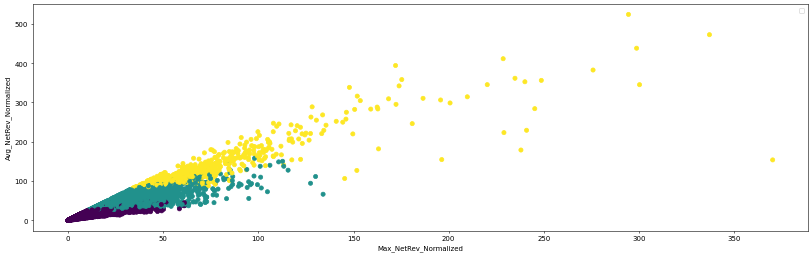

In [ ]:
plt.scatter(paychex.Max_NetRev_Normalized, paychex.Avg_NetRev_Normalized, c = paychex.Cluster, cmap = 'viridis',)
plt.xlabel('Max_NetRev_Normalized')
plt.ylabel('Avg_NetRev_Normalized')
plt.legend()

### <font color='blue'>***Check for Missing Data***</font>

In [ ]:
# Check for NA values
paychex.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42118 entries, 0 to 42118
Data columns (total 38 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ID                               42118 non-null  int64  
 1   Target                           42118 non-null  object 
 2   State                            42118 non-null  object 
 3   Industry_Code                    42118 non-null  int64  
 4   FedDepFreq                       42118 non-null  object 
 5   Business_Source                  42118 non-null  int64  
 6   Previous_Method                  42118 non-null  int64  
 7   Payment_Method                   42118 non-null  int64  
 8   Report_Method                    42118 non-null  int64  
 9   CashPRInd                        42118 non-null  int64  
 10  SeasnlInd                        42118 non-null  int64  
 11  Pay_Weekly_pct                   42118 non-null  float64
 12  Pay_Bi_weekly_pct 

In [ ]:
paychex.isna().any()

ID                                 False
Target                             False
State                              False
Industry_Code                      False
FedDepFreq                         False
Business_Source                    False
Previous_Method                    False
Payment_Method                     False
Report_Method                      False
CashPRInd                          False
SeasnlInd                          False
Pay_Weekly_pct                     False
Pay_Bi_weekly_pct                  False
Pay_Semi_monthly_pct               False
Pay_Monthly_pct                    False
Pay_OtherFreq_pct                  False
WageLevel1_pct                     False
WageLevel2_pct                     False
WageLevel3_pct                     False
WageLevel4_pct                     False
WageLevel5_pct                     False
EE_Health_Insurance_pct            False
EE_MedicalFSA_pct                  False
AvgNbrActiveEEs_Binned             False
AvgNbrProduct_Bi

### <font color='blue'>***Check for Outliers***</font>

In [ ]:
paychex2 = paychex.copy()

le = LabelEncoder()
paychex2['FedDepFreq'] = le.fit_transform(paychex2.FedDepFreq.values)
paychex2['State'] = le.fit_transform(paychex2.State.values)
paychex2['Target'] = le.fit_transform(paychex2.Target.values)

outlier_list = []

for col in paychex2.columns:

  paychex2[col].value_counts()
  outliers = paychex2[paychex2[col] > paychex2[col].mean() + 3 * paychex2[col].std()]
  outlier_list.append([str(col), len(outliers)])

In [ ]:
for i in outlier_list:
  if i[1] > 0:
    print(i)

['Target', 1639]
['Payment_Method', 1297]
['Report_Method', 509]
['CashPRInd', 607]
['SeasnlInd', 578]
['Pay_OtherFreq_pct', 84]
['WageLevel3_pct', 1199]
['WageLevel4_pct', 790]
['WageLevel5_pct', 949]
['EE_Health_Insurance_pct', 23]
['EE_MedicalFSA_pct', 2]
['Avg_AdjRev_Normalized', 677]
['Avg_ChrgRev_Normalized', 858]
['Avg_NetRev_Normalized', 794]
['Max_NetRev_Normalized', 683]
['Min_NetRev_Normalized', 822]
['Avg_HealthInsurance_Normalized', 16]
['Avg_MedicalFSA_Normalized', 2]
['Avg_Wage_Normalized', 50]
['Med_Wage_Normalized', 49]


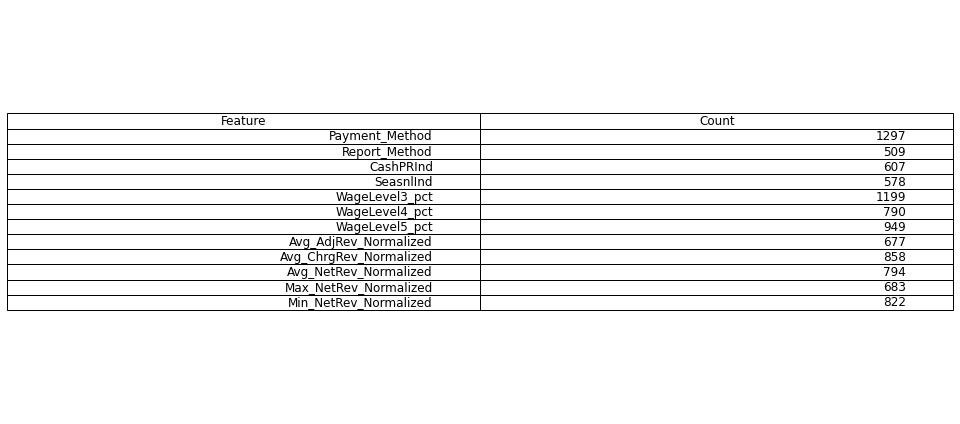

In [ ]:
outlier_df = pd.DataFrame(outlier_list, columns = ['Feature', 'Count'])
outlier_df = outlier_df[(outlier_df['Count']>100) & (outlier_df['Count']<1639)]

fig, ax = plt.subplots()
ax.axis('off')
ax.axis('tight')
t = ax.table(cellText=outlier_df.values, colWidths = [0.9]*len(outlier_df.columns),  colLabels=outlier_df.columns,  loc='center')
t.auto_set_font_size(False) 
t.set_fontsize(12)
fig.tight_layout()
plt.show()

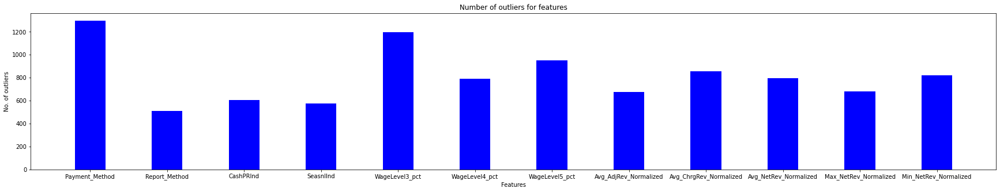

In [ ]:
ig = plt.figure(figsize = (30, 5))
 
# creating the bar plot
plt.bar(outlier_df['Feature'], outlier_df['Count'], color ='blue',
        width = 0.4)
 
plt.xlabel("Features")
plt.ylabel("No. of outliers")
plt.title("Number of outliers for features")
plt.show()

Text(0.5, 0, 'Features')

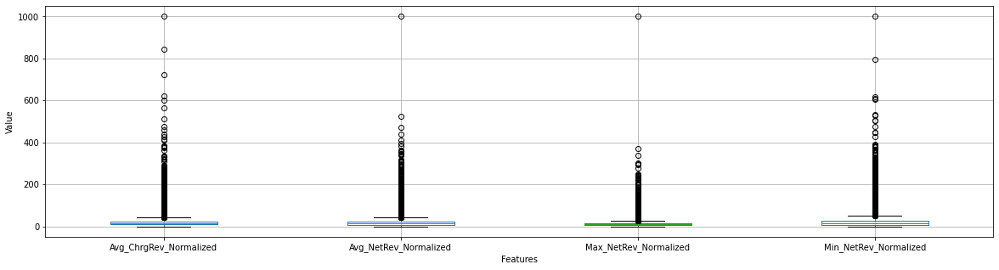

In [ ]:
ig = plt.figure(figsize = (20, 5))

boxplot = paychex.boxplot(column=['Avg_ChrgRev_Normalized', 'Avg_NetRev_Normalized','Max_NetRev_Normalized', 'Min_NetRev_Normalized'])
plt.ylabel("Value")
plt.xlabel("Features")


In [ ]:
# Drop outliers with z-score threshold of 5 (optional)

# from scipy import stats

# def drop_numerical_outliers(df, z_thresh=5):
#     # Constrains will contain `True` or `False` depending on if it is a value below the threshold.
#     constrains = df.select_dtypes(include=[np.number]) \
#         .apply(lambda x: np.abs(stats.zscore(x)) < z_thresh) \
#         .all(axis=1)
#     # Drop (inplace) values set to be rejected
#     df.drop(df.index[~constrains], inplace=True)

In [ ]:
# drop_numerical_outliers(paychex)
# len(paychex)

# <font color='red'>***Feature Engineering***</font>


### <font color='blue'>***K-Means***</font>

In [ ]:
paychex.dropna(inplace = True)
X = paychex[['AvgNbrProduct_Binned','Avg_NetRev_Normalized','Max_NetRev_Normalized','Min_NetRev_Normalized']]
kmeans = KMeans(n_clusters = 4, random_state = 0).fit(X)
paychex['Cluster'] = kmeans.labels_
paychex['Cluster'].value_counts()

1    32602
0     7946
2     1434
3      136
Name: Cluster, dtype: int64

In [ ]:
cc = KMeans(n_clusters = 4, random_state = 0).fit_transform(X)

avgDistance = np.mean(cc, axis=1)
paychex['dist'] = avgDistance

In [ ]:
for idx,row in paychex.iterrows(): #drop outliers
  if row.Max_NetRev_Normalized > 800:
    paychex.drop(index = idx, inplace = True)

No handles with labels found to put in legend.


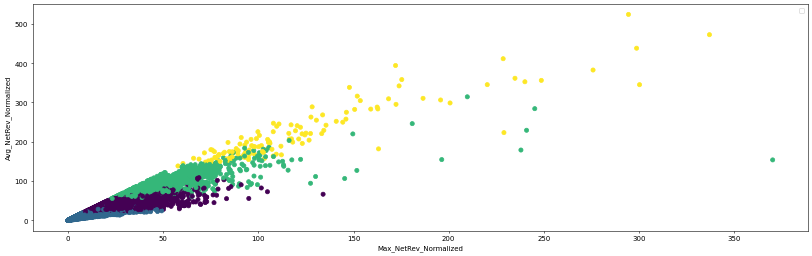

In [ ]:
plt.scatter(paychex.Max_NetRev_Normalized, paychex.Avg_NetRev_Normalized, c = paychex.Cluster, cmap = 'viridis',)
plt.xlabel('Max_NetRev_Normalized')
plt.ylabel('Avg_NetRev_Normalized')
plt.legend()

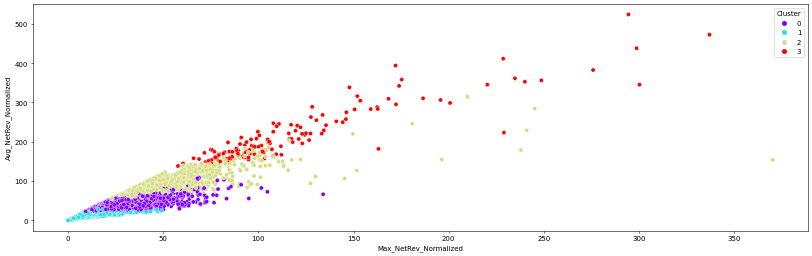

In [ ]:
sns.scatterplot(
    x=paychex.Max_NetRev_Normalized, y=paychex.Avg_NetRev_Normalized, hue = paychex.Cluster, 
    legend="full", palette="rainbow"
)

In [ ]:
one = paychex[paychex.Cluster == 0]
two = paychex[paychex.Cluster == 1]
three = paychex[paychex.Cluster == 2]

In [ ]:
one.Target.value_counts()

NonPEO           7183
PEO_NonMaster     621
PEO_Master        142
Name: Target, dtype: int64

In [ ]:
two.Target.value_counts()

NonPEO           31776
PEO_NonMaster      548
PEO_Master         278
Name: Target, dtype: int64

In [ ]:
three.Target.value_counts()

NonPEO           978
PEO_NonMaster    398
PEO_Master        58
Name: Target, dtype: int64

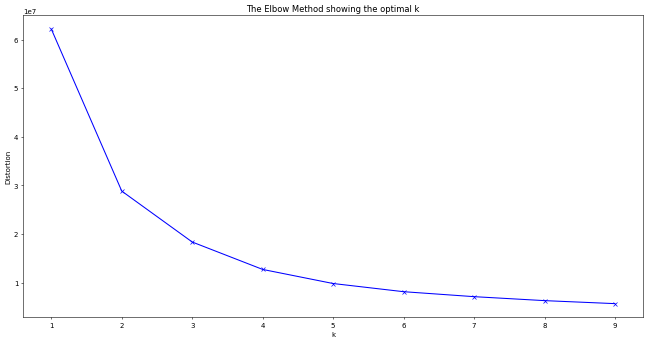

In [ ]:
distortions = []
x = paychex[['AvgNbrProduct_Binned', 'Avg_NetRev_Normalized','Max_NetRev_Normalized', 'Min_NetRev_Normalized']]

K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(x)
    distortions.append(kmeanModel.inertia_)

# Plotting the distortions of K-Means
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

### <font color='blue'>**DBScan**</font>

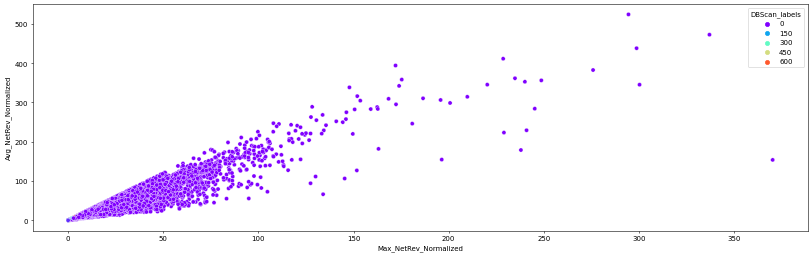

In [ ]:
from sklearn.cluster import DBSCAN

db = DBSCAN(eps=0.15, min_samples=3).fit(X)
paychex['DBScan_labels'] = db.labels_
sns.scatterplot(
    x=paychex.Max_NetRev_Normalized, y=paychex.Avg_NetRev_Normalized, hue = paychex.DBScan_labels, palette="rainbow"
)

### <font color='blue'>***ANOVA F-value for Feature Importance***</font>

In [ ]:
# Select 4 best features based on ANOVA F-value
from sklearn.feature_selection import SelectKBest
v1 = SelectKBest(k=4)
s = StandardScaler()
SX = s.fit_transform(X)
x_reduced= v1.fit_transform(SX, paychex['Target'])

In [ ]:
# Print 4 best features
from numpy import array
filter = v1.get_support()
features = array(X.columns)
 
print("All features:")
print(features)
 
print("Selected best 4:")
print(features[filter])

All features:
['AvgNbrProduct_Binned' 'Avg_NetRev_Normalized' 'Max_NetRev_Normalized'
 'Min_NetRev_Normalized']
Selected best 4:
['AvgNbrProduct_Binned' 'Avg_NetRev_Normalized' 'Max_NetRev_Normalized'
 'Min_NetRev_Normalized']


### <font color='blue'>***Lasso Regression for Feature Importance***</font>


In [ ]:
paychex.head()

,ID,Target,State,Industry_Code,FedDepFreq,Business_Source,Previous_Method,Payment_Method,Report_Method,CashPRInd,SeasnlInd,Pay_Weekly_pct,Pay_Bi_weekly_pct,Pay_Semi_monthly_pct,Pay_Monthly_pct,Pay_OtherFreq_pct,WageLevel1_pct,WageLevel2_pct,WageLevel3_pct,WageLevel4_pct,WageLevel5_pct,EE_Health_Insurance_pct,EE_MedicalFSA_pct,AvgNbrActiveEEs_Binned,AvgNbrProduct_Binned,AvgNbrPRsProc_Binned,AvgNbrPRsProcBilledItems_Binned,AvgTaxCount_Binned,Avg_AdjRev_Normalized,Avg_ChrgRev_Normalized,Avg_NetRev_Normalized,Max_NetRev_Normalized,Min_NetRev_Normalized,Avg_HealthInsurance_Normalized,Avg_MedicalFSA_Normalized,Avg_Wage_Normalized,Med_Wage_Normalized,Cluster,dist,DBScan_labels
0,1,NonPEO,MA,3,Monthly,6,4,1,2,0,0,0.0,0.0,0.0,1.0,0.0,1.00,0.00,0.0,0.0,0.00,0.0,0.0,5,9,1,2,5,0.000,15.306,16.286,9.094,23.474,0.0,0.0,0.000,0.000,1,129.757386,-1
1,2,NonPEO,MA,3,Semi-weekly,6,4,1,2,0,0,0.0,1.0,0.0,0.0,0.0,0.70,0.15,0.0,0.0,0.15,0.0,0.0,7,9,4,4,5,0.000,13.935,15.158,12.683,18.421,0.0,0.0,3.401,1.481,1,131.221891,-1
2,3,NonPEO,MA,11,Monthly,6,4,1,2,0,0,1.0,0.0,0.0,0.0,0.0,0.50,0.50,0.0,0.0,0.00,0.0,0.0,4,9,4,2,5,0.000,10.450,11.404,7.742,10.633,0.0,0.0,1.641,1.641,1,136.847091,-1
3,4,NonPEO,MA,3,Semi-weekly,6,4,1,2,0,0,0.0,1.0,0.0,0.0,0.0,0.65,0.25,0.0,0.1,0.00,0.0,0.0,9,10,4,5,5,0.000,23.765,25.935,17.597,32.678,0.0,0.0,1.688,0.887,0,121.918068,-1
4,5,NonPEO,MA,2,Monthly,6,4,2,2,0,1,1.0,0.0,0.0,0.0,0.0,0.25,0.25,0.5,0.0,0.00,0.0,0.0,6,4,4,3,5,54.126,8.555,11.961,7.562,10.254,0.0,0.0,3.131,3.544,1,136.378749,-1


In [ ]:
features = paychex.columns

X = paychex[features]

le = LabelEncoder()
X['FedDepFreq'] = le.fit_transform(X.FedDepFreq.values)
X['State'] = le.fit_transform(X.State.values)
X['Target'] = le.fit_transform(X.Target.values)

y = X['Target']

X = X.drop(columns = ['Target'])

features = features.drop(labels = 'Target')
print(features)

Index(['ID', 'State', 'Industry_Code', 'FedDepFreq', 'Business_Source',
       'Previous_Method', 'Payment_Method', 'Report_Method', 'CashPRInd',
       'SeasnlInd', 'Pay_Weekly_pct', 'Pay_Bi_weekly_pct',
       'Pay_Semi_monthly_pct', 'Pay_Monthly_pct', 'Pay_OtherFreq_pct',
       'WageLevel1_pct', 'WageLevel2_pct', 'WageLevel3_pct', 'WageLevel4_pct',
       'WageLevel5_pct', 'EE_Health_Insurance_pct', 'EE_MedicalFSA_pct',
       'AvgNbrActiveEEs_Binned', 'AvgNbrProduct_Binned',
       'AvgNbrPRsProc_Binned', 'AvgNbrPRsProcBilledItems_Binned',
       'AvgTaxCount_Binned', 'Avg_AdjRev_Normalized', 'Avg_ChrgRev_Normalized',
       'Avg_NetRev_Normalized', 'Max_NetRev_Normalized',
       'Min_NetRev_Normalized', 'Avg_HealthInsurance_Normalized',
       'Avg_MedicalFSA_Normalized', 'Avg_Wage_Normalized',
       'Med_Wage_Normalized', 'Cluster', 'dist', 'DBScan_labels'],
      dtype='object')


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# Use pipeline obj to scale all obs for modeling
pipeline = Pipeline([
                     ('scaler',StandardScaler()),
                     ('model',Lasso())
])

# Use grid search to optimize alpha param for Lasso
search = GridSearchCV(pipeline,
                      {'model__alpha':np.arange(0.1,10,0.1)},
                      cv = 5, scoring="neg_mean_squared_error", verbose=3
                      )

search.fit(X_train,y_train)

#print('best alpha for lasso: ', search.best_params_)

coefficients = search.best_estimator_.named_steps['model'].coef_

Fitting 5 folds for each of 99 candidates, totalling 495 fits
[CV 1/5] END .................model__alpha=0.1;, score=-0.156 total time=   0.1s
[CV 2/5] END .................model__alpha=0.1;, score=-0.141 total time=   0.1s
[CV 3/5] END .................model__alpha=0.1;, score=-0.148 total time=   0.1s
[CV 4/5] END .................model__alpha=0.1;, score=-0.148 total time=   0.1s
[CV 5/5] END .................model__alpha=0.1;, score=-0.163 total time=   0.1s
[CV 1/5] END .................model__alpha=0.2;, score=-0.160 total time=   0.1s
[CV 2/5] END .................model__alpha=0.2;, score=-0.146 total time=   0.1s
[CV 3/5] END .................model__alpha=0.2;, score=-0.153 total time=   0.1s
[CV 4/5] END .................model__alpha=0.2;, score=-0.152 total time=   0.1s
[CV 5/5] END .................model__alpha=0.2;, score=-0.167 total time=   0.1s
[CV 1/5] END .model__alpha=0.30000000000000004;, score=-0.160 total time=   0.1s
[CV 2/5] END .model__alpha=0.30000000000000004;

In [ ]:
# Find features which survive the regression (Lasso cost function automatically discards unimportant features)

importance = np.abs(coefficients)
print(importance)

relevant = np.array(features)[importance > 0]
irrelevant = np.array(features)[importance == 0]

print('\nRelevant Features: ', relevant)

print('\nIrrelevant Features: ', irrelevant)

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.00263356
 0.         0.         0.         0.         0.         0.01120971
 0.         0.00745642 0.         0.         0.         0.
 0.         0.         0.        ]

Relevant Features:  ['AvgNbrProduct_Binned' 'Avg_NetRev_Normalized' 'Min_NetRev_Normalized']

Irrelevant Features:  ['ID' 'State' 'Industry_Code' 'FedDepFreq' 'Business_Source'
 'Previous_Method' 'Payment_Method' 'Report_Method' 'CashPRInd'
 'SeasnlInd' 'Pay_Weekly_pct' 'Pay_Bi_weekly_pct' 'Pay_Semi_monthly_pct'
 'Pay_Monthly_pct' 'Pay_OtherFreq_pct' 'WageLevel1_pct' 'WageLevel2_pct'
 'WageLevel3_pct' 'WageLevel4_pct' 'WageLevel5_pct'
 'EE_Health_Insurance_pct' 'EE_MedicalFSA_pct' 'AvgNbrActiveEEs_Binned'
 'AvgNbrPRsProc_Binned' 'AvgNbrPRsProcBilledItems_Binned'
 'AvgTaxCount_Binned' 'Av

In [ ]:
paychex2=paychex[['AvgNbrProduct_Binned','Avg_NetRev_Normalized','Min_NetRev_Normalized','Target']]
paychex2

,AvgNbrProduct_Binned,Avg_NetRev_Normalized,Min_NetRev_Normalized,Target
0,9,16.286,23.474,NonPEO
1,9,15.158,18.421,NonPEO
2,9,11.404,10.633,NonPEO
3,10,25.935,32.678,NonPEO
4,4,11.961,10.254,NonPEO
...,...,...,...,...
42114,8,11.835,15.171,NonPEO
42115,5,14.406,22.805,NonPEO
42116,4,5.775,9.197,NonPEO
42117,1,5.605,6.155,NonPEO


In [ ]:
fig = px.scatter_3d(paychex2, x='AvgNbrProduct_Binned', y='Avg_NetRev_Normalized', z='Min_NetRev_Normalized',
                              color='Target', size_max=18)
fig.update_layout(
    autosize=False,
    width=1800,
    height=800,)
fig.show()

In [ ]:
fig = px.scatter(paychex, x='AvgNbrProduct_Binned', y='Min_NetRev_Normalized',
                          color='Target', size_max=18)
fig.update_layout(
    autosize=False,
    width=800,
    height=800,)
fig.show()

### <font color='blue'>***Random Forest for Feature Importance*** </font>





In [ ]:
len(paychex.columns)

40

In [ ]:
# Random Forest for Feature classification
from sklearn.ensemble import RandomForestClassifier
features = paychex.columns

X = paychex[features]

le = LabelEncoder()
X['FedDepFreq'] = le.fit_transform(X.FedDepFreq.values)
X['State'] = le.fit_transform(X.State.values)
X['Target'] = le.fit_transform(X.Target.values)
X["Target"].replace({2: 1}, inplace=True)
y = X['Target']

X = X.drop(columns = ['Target','ID'])
scaler = StandardScaler()
scaled = scaler.fit(X)
X1=scaled.transform(X)
feature_names = [f'features {i}' for i in range(X.shape[1])]
forest = RandomForestClassifier(random_state=0)
forest.fit(X1, y)

RandomForestClassifier(random_state=0)

In [ ]:
feature_names = [ i  for i in X.columns]

feature_names

['State',
 'Industry_Code',
 'FedDepFreq',
 'Business_Source',
 'Previous_Method',
 'Payment_Method',
 'Report_Method',
 'CashPRInd',
 'SeasnlInd',
 'Pay_Weekly_pct',
 'Pay_Bi_weekly_pct',
 'Pay_Semi_monthly_pct',
 'Pay_Monthly_pct',
 'Pay_OtherFreq_pct',
 'WageLevel1_pct',
 'WageLevel2_pct',
 'WageLevel3_pct',
 'WageLevel4_pct',
 'WageLevel5_pct',
 'EE_Health_Insurance_pct',
 'EE_MedicalFSA_pct',
 'AvgNbrActiveEEs_Binned',
 'AvgNbrProduct_Binned',
 'AvgNbrPRsProc_Binned',
 'AvgNbrPRsProcBilledItems_Binned',
 'AvgTaxCount_Binned',
 'Avg_AdjRev_Normalized',
 'Avg_ChrgRev_Normalized',
 'Avg_NetRev_Normalized',
 'Max_NetRev_Normalized',
 'Min_NetRev_Normalized',
 'Avg_HealthInsurance_Normalized',
 'Avg_MedicalFSA_Normalized',
 'Avg_Wage_Normalized',
 'Med_Wage_Normalized',
 'Cluster',
 'dist',
 'DBScan_labels']

In [ ]:
import time
import numpy as np

start_time = time.time()
importances = forest.feature_importances_
std = np.std([
    tree.feature_importances_ for tree in forest.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: "
      f"{elapsed_time:.3f} seconds")

Elapsed time to compute the importances: 0.018 seconds


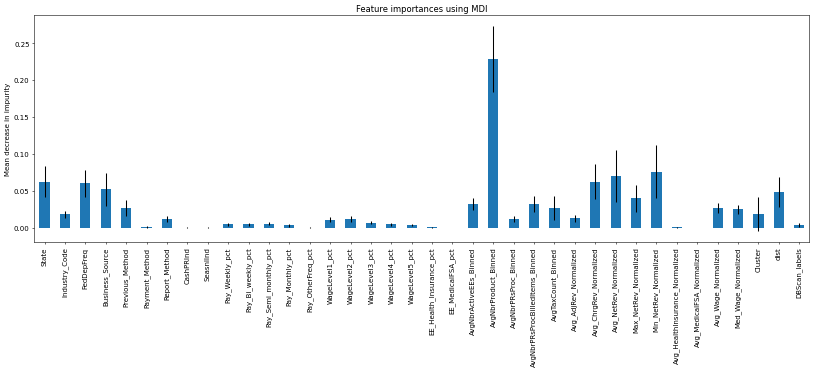

In [ ]:
import pandas as pd
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
plt.rcParams["figure.figsize"] = (40,10)

### <font color='blue'>***tSNE and PCA***</font>

In [ ]:
from sklearn.manifold import TSNE

pay_tsne = paychex.copy()
le = LabelEncoder()
pay_tsne['Target'] = le.fit_transform(pay_tsne.Target.values)
pay_tsne['State'] = le.fit_transform(pay_tsne.State.values)
pay_tsne['FedDepFreq'] = le.fit_transform(pay_tsne.FedDepFreq.values)

tsne = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(pay_tsne)

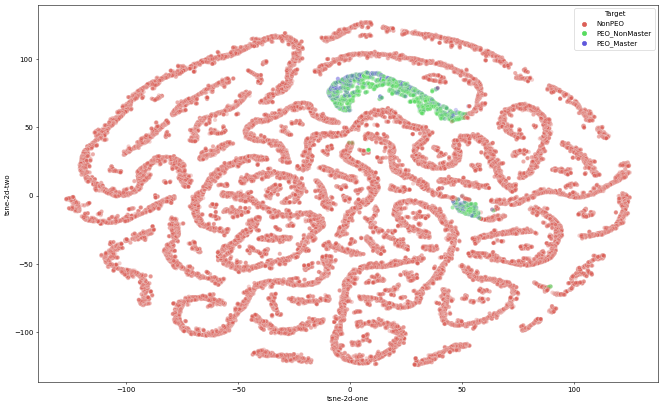

In [ ]:
y1=paychex['Target']
X['tsne-2d-one'] = tsne[:,0]
X['tsne-2d-two'] = tsne[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue=y1,
    palette=sns.color_palette("hls", 3),
    data=X,
    legend="full",
    alpha=0.3
)

In [ ]:
# PCA

from sklearn.decomposition import PCA
pay_pca = paychex.copy()

le = LabelEncoder()
pay_pca['FedDepFreq'] = le.fit_transform(pay_pca.FedDepFreq.values)
pay_pca['State'] = le.fit_transform(pay_pca.State.values)
pay_pca['Target'] = le.fit_transform(pay_pca.Target.values)

pca = PCA(n_components=3)
pca_result = pca.fit_transform(pay_pca.values)
X['pca-one'] = pca_result[:,0]
X['pca-two'] = pca_result[:,1] 
X['pca-three'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [9.99900509e-01 7.51666642e-05 1.30487757e-05]


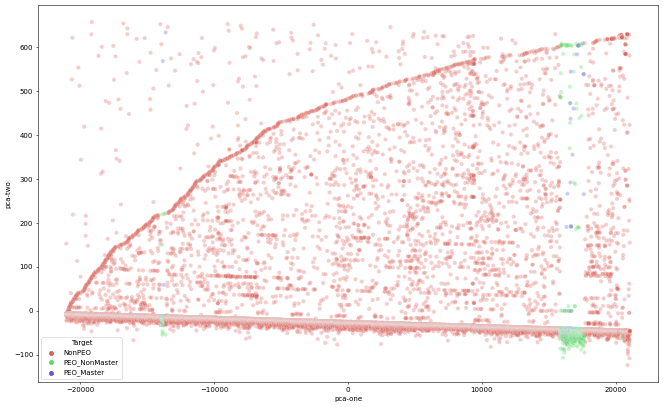

In [ ]:
y1=paychex['Target']

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue=y1,
    palette=sns.color_palette("hls", 3),
    data=X,
    legend="full",
    alpha=0.3
)

In [ ]:
pca.explained_variance_

array([1.47841170e+08, 1.11138333e+04, 1.92933822e+03])

### <font color='blue'> ***Split the Dataset*** </font>

In [ ]:
paychex_copy = paychex.copy()

y = paychex_copy['Target']
y = y.map({'NonPEO':0, 'PEO_Master':1, 'PEO_NonMaster':2}.get)
X = paychex_copy.drop(columns = ['Target','ID'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=40, stratify=y)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.5, random_state=40, stratify=y_test)

print(len(X_train),len(X_test),len(X_val))
print(' Ratio distribution in train: ', np.unique(y_train,return_counts=True))
print(' Ratio distribution in test: ' , np.unique(y_test,return_counts=True))
print(' Ratio distribution in val: ', np.unique(y_val,return_counts=True))

29482 6318 6318
 Ratio distribution in train:  (array([0, 1, 2]), array([27999,   336,  1147]))
 Ratio distribution in test:  (array([0, 1, 2]), array([6000,   72,  246]))
 Ratio distribution in val:  (array([0, 1, 2]), array([6000,   72,  246]))


In [ ]:
# Label encode categorical variables

le = LabelEncoder()

le1 = le.fit(X_train.FedDepFreq)
X_train['FedDepFreq']=le1.transform(X_train['FedDepFreq'])
X_test['FedDepFreq']=le1.transform(X_test['FedDepFreq'])
X_val['FedDepFreq']=le1.transform(X_val['FedDepFreq'])

le2 = le.fit(X_train.State)
X_train['State']=le2.transform(X_train['State'])
X_test['State']=le2.transform(X_test['State'])
X_val['State']=le2.transform(X_val['State'])

In [ ]:
# Scale numerical variables

scaler = StandardScaler()

scaled = scaler.fit(X_train)
X_train_scaled=scaled.transform(X_train)
X_test_scaled=scaled.transform(X_test)
X_val_scaled=scaled.transform(X_val)

### <font color='blue'> ***Oversampling*** </font>

In [ ]:
oversample = SMOTE()

X_train_scaled, y_train = oversample.fit_resample(X_train_scaled, y_train)
print(len(X_train),len(X_test),len(X_val))
print(' Ratio distribution in train: ', np.unique(y_train,return_counts=True))
print(' Ratio distribution in test: ' , np.unique(y_test,return_counts=True))
print(' Ratio distribution in val: ', np.unique(y_val,return_counts=True))

29482 6318 6318
 Ratio distribution in train:  (array([0, 1, 2]), array([27999, 27999, 27999]))
 Ratio distribution in test:  (array([0, 1, 2]), array([6000,   72,  246]))
 Ratio distribution in val:  (array([0, 1, 2]), array([6000,   72,  246]))


# <font color='Red'>***Model Building***</font>

### <font color='blue'>***Logistic Regression***</font>

In [ ]:
# Hyperparameter Tuning (Optuna)

def model_objective(trial):

    # Define search space
    _penalty = trial.suggest_categorical('penalty', ['l2','none'])
    _C = trial.suggest_int("C", 1, 50)   
    _max_iter = trial.suggest_int("max_iter", 500, 1000)

    # Define model
    model = LogisticRegression(penalty=_penalty, 
                               C=_C,  
                               class_weight='balanced', 
                               random_state=0,  
                               max_iter=_max_iter)

    # Fit model
    model.fit(X_train_scaled,y_train)

    # Predict binary classes
    y_pred = model.predict(X_val_scaled)
    cm = confusion_matrix(y_val,y_pred)
    recall = np.diag(cm) / np.sum(cm,axis=1)

    #return f1_score(y_true=y_test, y_pred=y_pred, pos_label=1)
    #return recall_score(y_true=y_test, y_pred=y_pred, labels=[1,2], average=None)
    #return recall_score(y_true=y_test, y_pred=y_pred, labels=[1,2], average='micro')
    return recall[1]

In [ ]:
# Study initialization
study = optuna.create_study(direction='maximize')

# Study optimization
study.optimize(model_objective, n_trials=10)

[I 2021-12-12 18:54:36,940] A new study created in memory with name: no-name-b81c8bc8-0f05-4869-9601-0e66c42f7b68
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1484: UserWarning:

Setting penalty='none' will ignore the C and l1_ratio parameters

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

[I 2021-12-12 18:55:07,054] Trial 0 finished with value: 0.6388888888888888 and parameters: {'penalty': 'none', 'C': 4, 'max_iter': 596}. Best is trial 0 with value: 0.6388888888888888.
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logis

In [ ]:
# Print best parameters and performance
trial = study.best_trial
params = trial.params
best_score = trial.value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {params}\n")

Best score: 0.6388888888888888

Optimized parameters: {'penalty': 'none', 'C': 4, 'max_iter': 596}



In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
optuna.visualization.plot_slice(study)

In [ ]:
# Rerun model using optimal parameters

# Define model
model = LogisticRegression(**params)

# Fit model
model.fit(X_train_scaled,y_train)

# Predict binary classes
y_pred = model.predict(X_test_scaled)

report = classification_report(y_true=y_test, y_pred=y_pred)
print(report)

print(pd.DataFrame(y_pred))

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1484: UserWarning:

Setting penalty='none' will ignore the C and l1_ratio parameters



              precision    recall  f1-score   support

           0       1.00      0.97      0.98      6000
           1       0.17      0.62      0.27        72
           2       0.63      0.61      0.62       246

    accuracy                           0.95      6318
   macro avg       0.60      0.73      0.62      6318
weighted avg       0.97      0.95      0.96      6318

      0
0     0
1     0
2     0
3     0
4     0
...  ..
6313  2
6314  0
6315  0
6316  0
6317  0

[6318 rows x 1 columns]


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



### <font color='blue'>***SVM***</font>

In [ ]:
# Hyperparameter Tuning (Optuna)

def model_objective(trial):

    # Define search space
    _C = trial.suggest_int("C", 1, 3)  
    _kernel = trial.suggest_categorical('kernel', ['linear','poly','rbf','sigmoid'])
    _degree = trial.suggest_int("degree", 1, 3) 

    # Define model
    model = svm.SVC(C=_C, 
                    kernel=_kernel, 
                    degree=_degree, 
                    class_weight='balanced', 
                    decision_function_shape='ovo',
                    random_state=0)

    # Fit model
    model.fit(X_train_scaled,y_train)

    # Predict binary classes
    y_pred = model.predict(X_val_scaled)
    cm = confusion_matrix(y_val,y_pred)
    recall = np.diag(cm) / np.sum(cm,axis=1)

    #return f1_score(y_true=y_test, y_pred=y_pred, pos_label=1)
    #return recall_score(y_true=y_test, y_pred=y_pred, labels=[1,2], average=None)
    #return recall_score(y_true=y_test, y_pred=y_pred, labels=[1,2], average='micro')
    return recall[1]

In [ ]:
# Study initialization
study = optuna.create_study(direction='maximize')

# Study optimization
study.optimize(model_objective, n_trials=2)

[I 2021-12-12 19:01:41,625] A new study created in memory with name: no-name-a244f1df-b3bf-47f7-9fb2-3a0b0d549c38
[I 2021-12-12 19:06:20,668] Trial 0 finished with value: 0.4305555555555556 and parameters: {'C': 3, 'kernel': 'sigmoid', 'degree': 2}. Best is trial 0 with value: 0.4305555555555556.
[I 2021-12-12 19:11:13,045] Trial 1 finished with value: 0.4305555555555556 and parameters: {'C': 1, 'kernel': 'sigmoid', 'degree': 3}. Best is trial 0 with value: 0.4305555555555556.


In [ ]:
# Print best parameters and performance
trial = study.best_trial
params = trial.params
best_score = trial.value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {params}\n")

Best score: 0.4305555555555556

Optimized parameters: {'C': 3, 'kernel': 'sigmoid', 'degree': 2}



In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
optuna.visualization.plot_slice(study)

In [ ]:
# Rerun model using optimal parameters on test dataset

# Define model
model = svm.SVC(**params)

# Fit model
model.fit(X_train_scaled,y_train)

# Predict binary classes
y_pred = model.predict(X_test_scaled)

report = classification_report(y_true=y_test, y_pred=y_pred)
print(report)

print(pd.DataFrame(y_pred))

              precision    recall  f1-score   support

           0       1.00      0.84      0.91      6000
           1       0.09      0.51      0.16        72
           2       0.14      0.50      0.22       246

    accuracy                           0.82      6318
   macro avg       0.41      0.62      0.43      6318
weighted avg       0.95      0.82      0.87      6318

      0
0     0
1     0
2     0
3     0
4     0
...  ..
6313  2
6314  0
6315  0
6316  0
6317  0

[6318 rows x 1 columns]


## <font color='blue'>***LGBM***</font>

In [ ]:
# Hyperparameter Tuning (Optuna)

from lightgbm import LGBMClassifier

def model_objective(trial):

    # Define search space
    _num_leaves = trial.suggest_int("num_leaves", 2, 100)
    _learning_rate = trial.suggest_float("learning_rate", 0.01, 1)
    _n_estimators = trial.suggest_int("n_estimators", 1, 300)
    _min_split_gain = trial.suggest_float("min_split_gain", 0.0, 1)
    _min_child_weight = trial.suggest_float("min_child_weight", 0.001, 1)
    _min_child_samples = trial.suggest_int("min_child_samples", 1, 100)

    # Define model
    model = LGBMClassifier(num_leaves=_num_leaves, 
                           learning_rate=_learning_rate, 
                           n_estimators=_n_estimators, 
                           min_split_gain=_min_split_gain, 
                           min_child_weight=_min_child_weight, 
                           min_child_samples=_min_child_samples)

    # Fit model
    model.fit(X_train_scaled,y_train)

    # Predict binary classes
    y_pred = model.predict(X_val_scaled)
    cm = confusion_matrix(y_val,y_pred)
    recall = np.diag(cm) / np.sum(cm,axis=1)

    #return f1_score(y_true=y_test, y_pred=y_pred, pos_label=1)
    #return recall_score(y_true=y_test, y_pred=y_pred, labels=[1,2], average=None)
    #return recall_score(y_true=y_test, y_pred=y_pred, labels=[1,2], average='micro')
    return recall[1]

In [ ]:
# Study initialization
study = optuna.create_study(direction='maximize')

# Study optimization
study.optimize(model_objective, n_trials=10)

[I 2021-12-12 19:15:51,968] A new study created in memory with name: no-name-ac114a61-4f54-4953-9bcf-23dd8cb5d833
[I 2021-12-12 19:15:54,871] Trial 0 finished with value: 0.2361111111111111 and parameters: {'num_leaves': 92, 'learning_rate': 0.6247601241642692, 'n_estimators': 166, 'min_split_gain': 0.5561759362745802, 'min_child_weight': 0.3021289393384626, 'min_child_samples': 29}. Best is trial 0 with value: 0.2361111111111111.
[I 2021-12-12 19:15:59,300] Trial 1 finished with value: 0.3472222222222222 and parameters: {'num_leaves': 9, 'learning_rate': 0.2655263515865635, 'n_estimators': 219, 'min_split_gain': 0.9485584572369606, 'min_child_weight': 0.3528893980218268, 'min_child_samples': 29}. Best is trial 1 with value: 0.3472222222222222.
[I 2021-12-12 19:16:01,091] Trial 2 finished with value: 0.2638888888888889 and parameters: {'num_leaves': 15, 'learning_rate': 0.8137892842420464, 'n_estimators': 66, 'min_split_gain': 0.4882137738526806, 'min_child_weight': 0.6401235455876289,

In [ ]:
# Print best parameters and performance
trial = study.best_trial
params = trial.params
best_score = trial.value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {params}\n")

Best score: 0.4722222222222222

Optimized parameters: {'num_leaves': 12, 'learning_rate': 0.03263870000901472, 'n_estimators': 239, 'min_split_gain': 0.405068167928071, 'min_child_weight': 0.5169337055188409, 'min_child_samples': 92}



In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
optuna.visualization.plot_slice(study)

In [ ]:
# Rerun model using optimal parameters

# Define model
model = LGBMClassifier(**params)

# Fit model
model.fit(X_train_scaled,y_train)

# Predict binary classes
y_pred = model.predict(X_test_scaled)

report = classification_report(y_true=y_test, y_pred=y_pred)
print(report)

print(pd.DataFrame(y_pred))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      6000
           1       0.29      0.61      0.39        72
           2       0.59      0.67      0.63       246

    accuracy                           0.96      6318
   macro avg       0.63      0.75      0.67      6318
weighted avg       0.97      0.96      0.97      6318

      0
0     0
1     0
2     0
3     0
4     0
...  ..
6313  2
6314  0
6315  0
6316  0
6317  0

[6318 rows x 1 columns]


## <font color='Blue'>***XGBoost***</font>

### <font color='blue'>***XGBoost - Multiclass Classification (Optuna)***</font>

In [ ]:
# Hyperparameter Tuning (Optuna) 3 classes

def model_objective(trial):

    # Define search space
    _n_estimators = trial.suggest_int("n_estimators", 1, 300)
    _num_leaves = trial.suggest_int("num_leaves", 2, 200)
    _learning_rate = trial.suggest_float("learning_rate", 0.001, 0.5)
    _min_child_weight = trial.suggest_float("min_child_weight", 0.001, 1)
    _gamma = trial.suggest_float("gamma", 0.1, 10)
    _max_delta_step = trial.suggest_float("max_delta_step", 0.1, 10)

    # Define model
    model = XGBClassifier(n_estimators=_n_estimators,
                          num_leaves=_num_leaves, 
                          learning_rate=_learning_rate,  
                          min_child_weight=_min_child_weight, 
                          gamma=_gamma,
                          max_delta_step=_max_delta_step, 
                          booster='gbtree',
                          scale_pos_weight=.9,
                          random_state=0,
                          num_class=3, 
                          objective='multi:softprob')

    # Fit model
    model.fit(X_train_scaled,y_train)

    # Predict classes
    y_pred = model.predict(X_val_scaled)
    cm = confusion_matrix(y_val,y_pred)
    recall = np.diag(cm) / np.sum(cm,axis=1)

    #return classification_report(y_true=y_test, y_pred=y_pred)
    #return f1_score(y_true=y_test, y_pred=y_pred, pos_label=1)
    #return recall_score(y_true=y_test, y_pred=y_pred, labels=[1,2], average=None)
    #return recall_score(y_true=y_test, y_pred=y_pred, labels=[1,2], average='weighted')
    return recall[1]
    # return roc_auc_score(y_test, pred_p, multi_class='ovo')

In [ ]:
# Study initialization
study = optuna.create_study(direction='maximize')
# Study optimization
study.optimize(model_objective, n_trials=10)

[I 2021-12-12 19:16:30,098] A new study created in memory with name: no-name-24781120-c6d8-4ba8-9f1f-dd00ec81d200
[I 2021-12-12 19:18:11,685] Trial 0 finished with value: 0.4166666666666667 and parameters: {'n_estimators': 213, 'num_leaves': 44, 'learning_rate': 0.40398186714328893, 'min_child_weight': 0.0224925519294294, 'gamma': 6.0482905731349, 'max_delta_step': 2.789311940464887}. Best is trial 0 with value: 0.4166666666666667.
[I 2021-12-12 19:18:32,106] Trial 1 finished with value: 0.6111111111111112 and parameters: {'n_estimators': 41, 'num_leaves': 73, 'learning_rate': 0.0409263116348834, 'min_child_weight': 0.32611106109242366, 'gamma': 2.2007883420898278, 'max_delta_step': 1.8743995311476973}. Best is trial 1 with value: 0.6111111111111112.
[I 2021-12-12 19:18:59,054] Trial 2 finished with value: 0.5833333333333334 and parameters: {'n_estimators': 55, 'num_leaves': 126, 'learning_rate': 0.13459678494607843, 'min_child_weight': 0.9487922929599607, 'gamma': 2.7157514521697426, 

In [ ]:
# Print best parameters and performance
trial = study.best_trial
params = trial.params
best_score = trial.value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {params}\n")

Best score: 0.6111111111111112

Optimized parameters: {'n_estimators': 41, 'num_leaves': 73, 'learning_rate': 0.0409263116348834, 'min_child_weight': 0.32611106109242366, 'gamma': 2.2007883420898278, 'max_delta_step': 1.8743995311476973}



In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
optuna.visualization.plot_slice(study)

In [ ]:
# Best parameters
params={'gamma': 9.962645218941677,
        'learning_rate': 0.05306236777089682,
        'max_delta_step': 5.2850452651228945,
        'min_child_weight': 0.46157329476998177,
        'n_estimators': 102,
        'num_class': 3,
        'num_leaves': 65,
        'objective': 'multi:softprob'}

In [ ]:
# Rerun model using optimal parameters on validation dataset

# Define model
model = XGBClassifier(**params)

# Fit model
model.fit(X_train_scaled,y_train)

# Predict classes
y_pred = model.predict(X_val_scaled)

report = classification_report(y_true=y_val, y_pred=y_pred)
print(report)

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      6000
           1       0.18      0.51      0.26        72
           2       0.47      0.61      0.53       246

    accuracy                           0.94      6318
   macro avg       0.55      0.69      0.59      6318
weighted avg       0.97      0.94      0.95      6318



In [ ]:
# Rerun model using optimal parameters on test dataset

# Define model
model = XGBClassifier(**params)

# Fit model
model.fit(X_train_scaled,y_train)

# Predict classes
y_pred = model.predict(X_test_scaled)

report = classification_report(y_true=y_test, y_pred=y_pred)
print(report)

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      6000
           1       0.21      0.65      0.31        72
           2       0.49      0.59      0.54       246

    accuracy                           0.94      6318
   macro avg       0.56      0.73      0.61      6318
weighted avg       0.97      0.94      0.95      6318



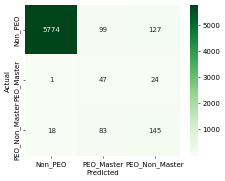

In [ ]:
# Plot confusion matrix
array = confusion_matrix(y_test, y_pred)
df = pd.DataFrame(array, index=['Non_PEO', 'PEO_Master','PEO_Non_Master'], columns=['Non_PEO', 'PEO_Master','PEO_Non_Master'])

plt.figure(figsize=(5, 4))
sns.heatmap(df, annot=True, cmap='Greens', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
# Save probabilities and export the data to a cvs file for the sales application
pred_p = model.predict_proba(X_test_scaled)

np.set_printoptions(suppress=True)
prediction_dataframe= pd.DataFrame(pred_p)
prediction_dataframe['Id']=X_test.index
prediction_dataframe.to_csv('predictions_3class.csv')

### <font color='blue'>***XGBoost - Binary Classification (Optuna)***</font>

In [ ]:
# Change from multiclass to binary
y_train.replace({2: 1}, inplace=True)
y_test.replace({2: 1}, inplace=True)
y_val.replace({2: 1}, inplace=True)

In [ ]:
# Hyperparameter Tuning (Optuna)

def model_objective(trial):

    # Define search space
    _n_estimators = trial.suggest_int("n_estimators", 1, 300)
    _num_leaves = trial.suggest_int("num_leaves", 2, 150)
    _learning_rate = trial.suggest_float("learning_rate", 0.01, 5)
    _min_child_weight = trial.suggest_float("min_child_weight", 0.001, 1)
    _gamma = trial.suggest_float("gamma", 0.1, 10)
    _max_delta_step = trial.suggest_float("max_delta_step", 0.1, 10)

    # Define model
    model = XGBClassifier(n_estimators=_n_estimators,
                          num_leaves=_num_leaves, 
                          learning_rate=_learning_rate,  
                          min_child_weight=_min_child_weight, 
                          gamma=_gamma,
                          max_delta_step=_max_delta_step, 
                          booster='gbtree',
                          scale_pos_weight=.9,
                          random_state=0,
                          num_class=2, 
                          objective='multi:softprob')

    # Fit model
    model.fit(X_train_scaled,y_train)

    # Predict binary classes
    y_pred = model.predict(X_val_scaled)
    cm = confusion_matrix(y_val,y_pred)
    recall = np.diag(cm) / np.sum(cm,axis=1)

    #return classification_report(y_true=y_test, y_pred=y_pred)
    #return f1_score(y_true=y_test, y_pred=y_pred, pos_label=1)
    #return recall_score(y_true=y_test, y_pred=y_pred, labels=[1,2], average=None)
    #return recall_score(y_true=y_test, y_pred=y_pred, labels=[1,2], average='weighted')
    return recall[1]

In [ ]:
# Study initialization
study = optuna.create_study(direction='maximize')

# Study optimization
study.optimize(model_objective, n_trials=10)

[I 2021-12-12 19:29:47,489] A new study created in memory with name: no-name-d0b140ae-c6e3-403f-a400-3447a43e3524
[I 2021-12-12 19:29:59,144] Trial 0 finished with value: 0.8679245283018868 and parameters: {'n_estimators': 39, 'num_leaves': 110, 'learning_rate': 4.476811252008385, 'min_child_weight': 0.8827576619481137, 'gamma': 0.24602364886887523, 'max_delta_step': 2.918649178143862}. Best is trial 0 with value: 0.8679245283018868.
[I 2021-12-12 19:30:29,262] Trial 1 finished with value: 0.8930817610062893 and parameters: {'n_estimators': 92, 'num_leaves': 20, 'learning_rate': 1.2831657627643096, 'min_child_weight': 0.14861561044174781, 'gamma': 1.772846707290378, 'max_delta_step': 1.1719450416091488}. Best is trial 1 with value: 0.8930817610062893.
[I 2021-12-12 19:30:42,486] Trial 2 finished with value: 0.3113207547169811 and parameters: {'n_estimators': 86, 'num_leaves': 24, 'learning_rate': 2.6649611335556065, 'min_child_weight': 0.4581386932538731, 'gamma': 2.284897969679241, 'm

In [ ]:
# Print best parameters and performance
trial = study.best_trial
params = trial.params
best_score = trial.value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {params}\n")

Best score: 0.9591194968553459

Optimized parameters: {'n_estimators': 13, 'num_leaves': 53, 'learning_rate': 2.6637616742417496, 'min_child_weight': 0.5950722132885645, 'gamma': 3.1538227804635266, 'max_delta_step': 4.67820184095098}



In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
optuna.visualization.plot_slice(study)

In [ ]:
# Best parameters
params={'gamma': 2.279747957618447,
        'learning_rate': 0.12892710507552513,
        'max_delta_step': 6.4664577441478714,
        'min_child_weight': 0.643421227843515,
        'n_estimators': 500,
        'num_class': 2,
        'num_leaves': 98,
        'objective': 'multi:softprob'}

In [ ]:
# Rerun model using optimal parameters on validation dataset

# Define model
model = XGBClassifier(**params)

# Fit model
model.fit(X_train_scaled,y_train)

# Predict binary classes
y_pred = model.predict(X_val_scaled)

report = classification_report(y_true=y_val, y_pred=y_pred)
print(report)

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      6000
           1       0.84      0.93      0.88       318

    accuracy                           0.99      6318
   macro avg       0.92      0.96      0.94      6318
weighted avg       0.99      0.99      0.99      6318



In [ ]:
# Rerun model using optimal parameters on test dataset

# Define model
model = XGBClassifier(**params)

# Fit model
model.fit(X_train_scaled,y_train)

# Predict binary classes
y_pred = model.predict(X_test_scaled)

report = classification_report(y_true=y_test, y_pred=y_pred)
print(report)

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      6000
           1       0.85      0.95      0.89       318

    accuracy                           0.99      6318
   macro avg       0.92      0.97      0.94      6318
weighted avg       0.99      0.99      0.99      6318



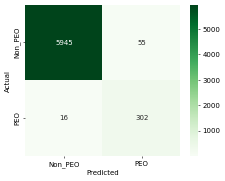

In [ ]:
# Plot confusion matrix
array = confusion_matrix(y_test, y_pred)
df = pd.DataFrame(array, index=['Non_PEO', 'PEO'], columns=['Non_PEO', 'PEO'])

plt.figure(figsize=(5, 4))
sns.heatmap(df, annot=True, cmap='Greens', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
# Save probabilities
pred_p = model.predict_proba(X_test_scaled)

np.set_printoptions(suppress=True)
prediction_dataframe= pd.DataFrame(pred_p)
prediction_dataframe['Id']=X_test.index
prediction_dataframe.to_csv('predictions_2class.csv')

Best Threshold=0.286787, G-Mean=0.982


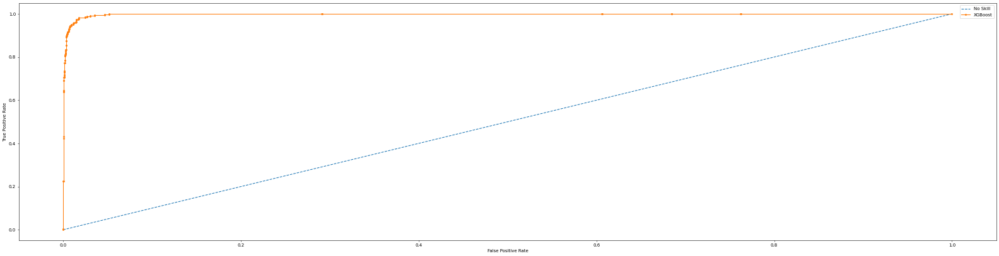

In [ ]:
# Plot AUC

yhat = model.predict_proba(X_test_scaled)
yhat = yhat[:, 1] # keep probabilities for the positive outcome only

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, yhat)
gmeans = np.sqrt(tpr * (1-fpr))
ix = np.argmax(gmeans)
print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

# Plot ROC curve
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='XGBoost')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

In [ ]:
roc_auc_score(y_test, model.predict_proba(X_test_scaled)[:, 1])

0.9980335429769392

### <font color='blue'>***XGBoost (Grid Search)***</font>

In [ ]:
# Change from multiclass to binary for binary case. Ignore for multiclass
y_train.replace({2: 1}, inplace=True)
y_test.replace({2: 1}, inplace=True)
y_val.replace({2: 1}, inplace=True)

In [ ]:
# import xgboost and create Dmatrix objects
import xgboost as xgb

D_train = xgb.DMatrix(np.asmatrix(X_train_scaled), label=y_train)
D_test = xgb.DMatrix(np.asmatrix(X_test_scaled), label=y_val)

In [ ]:
# Build model and grid search
model = XGBClassifier()

# Define search space
n_estimators = [50,100,200]
max_depth = [2,4,6,8]
eta= [0.01,0.02,0.03,0.1,0.5]
param_grid = dict(max_depth=max_depth, n_estimators=n_estimators,eta=eta)
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=7)
grid_search = GridSearchCV(model, param_grid, scoring="roc_auc", n_jobs=4, cv=kfold, verbose=1)
grid_result = grid_search.fit(X_train_scaled, y_train)

# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
	print("%f (%f) with: %r" % (mean, stdev, param))

Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best: 0.999972 using {'eta': 0.01, 'max_depth': 8, 'n_estimators': 200}
0.996066 (0.000366) with: {'eta': 0.01, 'max_depth': 2, 'n_estimators': 50}
0.998457 (0.000340) with: {'eta': 0.01, 'max_depth': 2, 'n_estimators': 100}
0.999574 (0.000130) with: {'eta': 0.01, 'max_depth': 2, 'n_estimators': 200}
0.999255 (0.000121) with: {'eta': 0.01, 'max_depth': 4, 'n_estimators': 50}
0.999849 (0.000037) with: {'eta': 0.01, 'max_depth': 4, 'n_estimators': 100}
0.999952 (0.000008) with: {'eta': 0.01, 'max_depth': 4, 'n_estimators': 200}
0.999725 (0.000049) with: {'eta': 0.01, 'max_depth': 6, 'n_estimators': 50}
0.999941 (0.000010) with: {'eta': 0.01, 'max_depth': 6, 'n_estimators': 100}
0.999968 (0.000007) with: {'eta': 0.01, 'max_depth': 6, 'n_estimators': 200}
0.999818 (0.000064) with: {'eta': 0.01, 'max_depth': 8, 'n_estimators': 50}
0.999957 (0.000010) with: {'eta': 0.01, 'max_depth': 8, 'n_estimators': 100}
0.999972 (0.000007) wit

In [ ]:
# Best parameters in binary case
param = {
    'eta': 0.01, 
    'max_depth': 8,  
    'objective': 'multi:softprob',  
    'num_class': 2,
    'n_estimators': 200,
    'eval_metric': 'aucpr'
    } 
eval_metric=["auc","error"]

In [ ]:
# Best parameters in multiclass case
param = {
    'eta': 0.01, 
    'max_depth': 6,  
    'objective': 'multi:softprob',  
    'num_class': 3,
    'n_estimators': 100,
    'eval_metric': 'aucpr'
    } 
eval_metric=["aucpr"]

In [ ]:
# Build model
model = xgb.train(param, D_train,200)

In [ ]:
# Print performance
preds = model.predict(D_test)
best_preds = np.asarray([np.argmax(line) for line in preds])

print(confusion_matrix(y_test, best_preds))
print(classification_report(y_true=y_test, y_pred=best_preds))
print("Precision = {}".format(precision_score(y_test, best_preds, average='micro')))
print("Recall = {}".format(recall_score(y_test, best_preds, average='micro')))
print("Accuracy = {}".format(accuracy_score(y_test, best_preds)))

[[5683  317]
 [  21  297]]
              precision    recall  f1-score   support

           0       1.00      0.95      0.97      6000
           1       0.48      0.93      0.64       318

    accuracy                           0.95      6318
   macro avg       0.74      0.94      0.80      6318
weighted avg       0.97      0.95      0.95      6318

Precision = 0.9465020576131687
Recall = 0.9465020576131687
Accuracy = 0.9465020576131687


# <font color='red'>*** *DEPRECATED CODE * ***</font>

The following code blocks are experimental and NOT ready for production/deployment by Paychex. We have kept this code in case the Paychex Data Science Team would like to rebuild our models in the future.

## <font color='red'>***Model Building - Binary Classification/Anomaly Detection***</font>

### <font color='blue'>***Neural Network Auto-encoder***</font>

#### <font color='blue'> ***Import Libraries & set Random Seeds*** </font>

In [ ]:
# read & manipulate data
import pandas as pd 
import numpy as np
import tensorflow as tf

# visualisations
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid', context='notebook')
%matplotlib notebook

# misc
import random as rn

# manual parameters
RANDOM_SEED = 42
TRAINING_SAMPLE = 30000
VALIDATE_SIZE = 0.2

# setting random seeds for libraries to ensure reproducibility
np.random.seed(RANDOM_SEED)
rn.seed(RANDOM_SEED)
#tf.set_random_seed(RANDOM_SEED)

#### <font color='blue'> ***Renaming columns*** </font>

In [ ]:
# let's quickly convert the columns to lower case and rename the target column 
# so as to not cause syntax errors
df = paychex.copy()
df.columns = map(str.lower, df.columns)
df.rename(columns={'target': 'label'}, inplace=True)

# label encode categorical variables
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
df['state_cat'] = labelencoder.fit_transform(df['state'])
df['feddepfreq_cat'] = labelencoder.fit_transform(df['feddepfreq'])
df.drop('state', axis=1, inplace=True)
df.drop('feddepfreq', axis=1, inplace=True)

# print first 5 rows to get an initial impression of the data we're dealing with
df.head()

,id,label,industry_code,business_source,previous_method,payment_method,report_method,cashprind,seasnlind,pay_weekly_pct,pay_bi_weekly_pct,pay_semi_monthly_pct,pay_monthly_pct,pay_otherfreq_pct,wagelevel1_pct,wagelevel2_pct,wagelevel3_pct,wagelevel4_pct,wagelevel5_pct,ee_health_insurance_pct,ee_medicalfsa_pct,avgnbractiveees_binned,avgnbrproduct_binned,avgnbrprsproc_binned,avgnbrprsprocbilleditems_binned,avgtaxcount_binned,avg_adjrev_normalized,avg_chrgrev_normalized,avg_netrev_normalized,max_netrev_normalized,min_netrev_normalized,avg_healthinsurance_normalized,avg_medicalfsa_normalized,avg_wage_normalized,med_wage_normalized,cluster,state_cat,feddepfreq_cat
0,1,NonPEO,3,6,4,1,2,0,0,0.0,0.0,0.0,1.0,0.0,1.00,0.00,0.0,0.0,0.00,0.0,0.0,5,9,1,2,5,0.000,15.306,16.286,9.094,23.474,0.0,0.0,0.000,0.000,0,19,0
1,2,NonPEO,3,6,4,1,2,0,0,0.0,1.0,0.0,0.0,0.0,0.70,0.15,0.0,0.0,0.15,0.0,0.0,7,9,4,4,5,0.000,13.935,15.158,12.683,18.421,0.0,0.0,3.401,1.481,0,19,1
2,3,NonPEO,11,6,4,1,2,0,0,1.0,0.0,0.0,0.0,0.0,0.50,0.50,0.0,0.0,0.00,0.0,0.0,4,9,4,2,5,0.000,10.450,11.404,7.742,10.633,0.0,0.0,1.641,1.641,0,19,0
3,4,NonPEO,3,6,4,1,2,0,0,0.0,1.0,0.0,0.0,0.0,0.65,0.25,0.0,0.1,0.00,0.0,0.0,9,10,4,5,5,0.000,23.765,25.935,17.597,32.678,0.0,0.0,1.688,0.887,0,19,1
4,5,NonPEO,2,6,4,2,2,0,1,1.0,0.0,0.0,0.0,0.0,0.25,0.25,0.5,0.0,0.00,0.0,0.0,6,4,4,3,5,54.126,8.555,11.961,7.562,10.254,0.0,0.0,3.131,3.544,0,19,0


#### <font color='blue'> ***Visualising clusters with t-SNE*** </font>

In [ ]:
# manual parameter 
RATIO_TO_FRAUD = 30

# splitting by class
fraud = df[df.label == "PEO_Master"]
clean = df[df.label == "NonPEO"]

# undersample clean transactions
clean_undersampled = clean.sample(
    int(len(fraud) * RATIO_TO_FRAUD),
    random_state=RANDOM_SEED
)

# concatenate with fraud transactions into a single dataframe
visualisation_initial = pd.concat([fraud, clean_undersampled])
column_names = list(visualisation_initial.drop('label', axis=1).columns)

# isolate features from labels 
features, labels = visualisation_initial.drop('label', axis=1).values, visualisation_initial.label.values

In [ ]:
print(f"""The non-fraud dataset has been undersampled from {len(clean):,} to {len(clean_undersampled):,}.
This represents a ratio of {RATIO_TO_FRAUD}:1 to fraud.""")

The non-fraud dataset has been undersampled from 39,999 to 14,400.
This represents a ratio of 30:1 to fraud.


In [ ]:
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D

tsne = TSNE(n_components=2, random_state=RANDOM_SEED).fit_transform(features)

In [ ]:
features_df = pd.DataFrame(features)
features_df['tsne_2d_one'] = tsne[:,0]
features_df['tsne_2d_two'] = tsne[:,1]

labels_df = pd.DataFrame(labels)

whole_df = pd.concat([features_df, labels_df], axis=1)
whole_df.columns.values[-1] = "label"

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne_2d_one", y="tsne_2d_two",
    hue="label",
    palette=sns.color_palette("hls", 2),
    data=whole_df,
    legend="full",
    alpha=0.3
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### <font color='blue'> ***Train/Validate/Test split*** </font>

In [ ]:
print(f"""Shape of the datasets:
    clean (rows, cols) = {clean.shape}
    fraud (rows, cols) = {fraud.shape}""")

Shape of the datasets:
    clean (rows, cols) = (39999, 38)
    fraud (rows, cols) = (480, 38)


In [ ]:
# shuffle our training set
clean = clean.sample(frac=1).reset_index(drop=True)

# training set: exclusively non-fraud transactions
X_train = clean.iloc[:TRAINING_SAMPLE].drop('label', axis=1)

# testing set: the remaining non-fraud + all the fraud 
X_test = clean.iloc[TRAINING_SAMPLE:].append(fraud).sample(frac=1)

In [ ]:
from sklearn.model_selection import train_test_split

# train // validate - no labels since they're all clean anyway
X_train, X_validate = train_test_split(X_train, 
                                       test_size=VALIDATE_SIZE, 
                                       random_state=RANDOM_SEED)

# manually splitting the labels from the test df
X_test, y_test = X_test.drop('label', axis=1).values, X_test.label.values

#### <font color='blue'> ***Normalising & Standardising*** </font>

In [ ]:
from sklearn.preprocessing import Normalizer, MinMaxScaler
from sklearn.pipeline import Pipeline

# configure our pipeline
pipeline = Pipeline([('normalizer', Normalizer()),
                     ('scaler', MinMaxScaler())])

In [ ]:
# get normalization parameters by fitting to the training data
pipeline.fit(X_train);

In [ ]:
# transform the training and validation data with these parameters
X_train_transformed = pipeline.transform(X_train)
X_validate_transformed = pipeline.transform(X_validate)

#### <font color='blue'> ***Training the auto-encoder*** </font>

In [ ]:
# Load the extension and start TensorBoard
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
# data dimensions // hyperparameters 
input_dim = X_train_transformed.shape[1]
BATCH_SIZE = 256
EPOCHS = 100

# https://keras.io/layers/core/
autoencoder = tf.keras.models.Sequential([
    
    # deconstruct / encode
    tf.keras.layers.Dense(input_dim, activation='elu', input_shape=(input_dim, )), 
    tf.keras.layers.Dense(16, activation='elu'),
    tf.keras.layers.Dense(8, activation='elu'),
    tf.keras.layers.Dense(4, activation='elu'),
    tf.keras.layers.Dense(2, activation='elu'),
    
    # reconstruction / decode
    tf.keras.layers.Dense(4, activation='elu'),
    tf.keras.layers.Dense(8, activation='elu'),
    tf.keras.layers.Dense(16, activation='elu'),
    tf.keras.layers.Dense(input_dim, activation='elu')
    
])

# https://keras.io/api/models/model_training_apis/
autoencoder.compile(optimizer="adam", 
                    loss="mse",
                    metrics=["acc"])

# print an overview of our model
autoencoder.summary();

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 37)                1406      
_________________________________________________________________
dense_1 (Dense)              (None, 16)                608       
_________________________________________________________________
dense_2 (Dense)              (None, 8)                 136       
_________________________________________________________________
dense_3 (Dense)              (None, 4)                 36        
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 10        
_________________________________________________________________
dense_5 (Dense)              (None, 4)                 12        
_________________________________________________________________
dense_6 (Dense)              (None, 8)                 4

In [ ]:
from datetime import datetime

# current date and time
yyyymmddHHMM = datetime.now().strftime('%Y%m%d%H%M')

# new folder for a new run
log_subdir = f'{yyyymmddHHMM}_batch{BATCH_SIZE}_layers{len(autoencoder.layers)}'

# define our early stopping
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.0001,
    patience=10,
    verbose=1, 
    mode='min',
    restore_best_weights=True
)

save_model = tf.keras.callbacks.ModelCheckpoint(
    filepath='autoencoder_best_weights.hdf5',
    save_best_only=True,
    monitor='val_loss',
    verbose=0,
    mode='min'
)

tensorboard = tf.keras.callbacks.TensorBoard(
    f'logs/{log_subdir}',
    batch_size=BATCH_SIZE,
    update_freq='batch'
)

# callbacks argument only takes a list
cb = [early_stop, save_model, tensorboard]

In [ ]:
history = autoencoder.fit(
    X_train_transformed, X_train_transformed,
    shuffle=True,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=cb,
    validation_data=(X_validate_transformed, X_validate_transformed)
);

Epoch 1/100
94/94 [==============================] - 1s 5ms/step - loss: 0.0084 - acc: 0.9659 - val_loss: 9.8268e-04 - val_acc: 0.9980
Epoch 2/100
94/94 [==============================] - 0s 2ms/step - loss: 3.6858e-04 - acc: 0.9983 - val_loss: 9.0701e-04 - val_acc: 0.9983
Epoch 3/100
94/94 [==============================] - 0s 2ms/step - loss: 2.7049e-04 - acc: 0.9984 - val_loss: 8.3213e-04 - val_acc: 0.9983
Epoch 4/100
94/94 [==============================] - 0s 2ms/step - loss: 2.0117e-04 - acc: 0.9983 - val_loss: 7.9030e-04 - val_acc: 0.9982
Epoch 5/100
94/94 [==============================] - 0s 2ms/step - loss: 1.6984e-04 - acc: 0.9984 - val_loss: 7.7320e-04 - val_acc: 0.9982
Epoch 6/100
94/94 [==============================] - 0s 2ms/step - loss: 1.5681e-04 - acc: 0.9984 - val_loss: 7.6171e-04 - val_acc: 0.9982
Epoch 7/100
94/94 [==============================] - 0s 2ms/step - loss: 1.5050e-04 - acc: 0.9983 - val_loss: 7.6154e-04 - val_acc: 0.9982
Epoch 8/100
94/94 [============

#### <font color='blue'> ***Reconstructions*** </font>

In [ ]:
# transform the test set with the pipeline fitted to the training set
X_test_transformed = pipeline.transform(X_test)

# pass the transformed test set through the autoencoder to get the reconstructed result
reconstructions = autoencoder.predict(X_test_transformed)

In [ ]:
# calculating the mean squared error reconstruction loss per row in the numpy array
mse = np.mean(np.power(X_test_transformed - reconstructions, 2), axis=1)

In [ ]:
clean = mse[y_test=="NonPEO"]
fraud = mse[y_test=="PEO_Master"]

fig, ax = plt.subplots(figsize=(6,6))

ax.hist(clean, bins=4, density=True, label="clean", alpha=.6, color="green")
ax.hist(fraud, bins=4, density=True, label="fraud", alpha=.6, color="red")

plt.title("(Normalized) Distribution of the Reconstruction Loss")
plt.legend()
plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

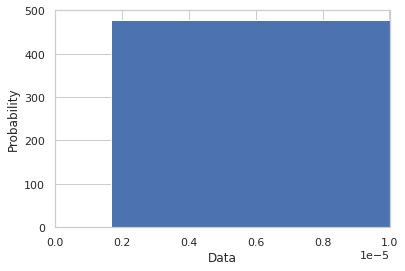

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

np.random.seed(42)

plt.xlim([0, 0.00001])
plt.hist(fraud, density=False, bins=80)  # density=False would make counts
plt.ylabel('Probability')
plt.xlabel('Data');

#### <font color='blue'> ***Setting a threshold for classification*** </font>

In [ ]:
THRESHOLD = 3

def mad_score(points):
    """https://www.itl.nist.gov/div898/handbook/eda/section3/eda35h.htm """
    m = np.median(points)
    ad = np.abs(points - m)
    mad = np.median(ad)
    
    return 0.6745 * ad / mad

z_scores = mad_score(mse)
outliers = z_scores > THRESHOLD

In [ ]:
print(f"Detected {np.sum(outliers):,} outliers in a total of {np.size(z_scores):,} transactions [{np.sum(outliers)/np.size(z_scores):.2%}].")

Detected 1,543 outliers in a total of 10,479 transactions [14.72%].


In [ ]:
from sklearn.metrics import (confusion_matrix, 
                             precision_recall_curve)

# adjust y_test for cm
y_test_new = np.where(y_test == 'NonPEO', 0, 1)

# get (mis)classification
cm = confusion_matrix(y_test_new, outliers)

# true/false positives/negatives
(tn, fp, 
 fn, tp) = cm.flatten()

In [ ]:
print(f"""The classifications using the MAD method with threshold={THRESHOLD} are as follows:
{cm}

% of transactions labeled as fraud that were correct (precision): {tp}/({fp}+{tp}) = {tp/(fp+tp):.2%}
% of fraudulent transactions were caught succesfully (recall):    {tp}/({fn}+{tp}) = {tp/(fn+tp):.2%}""")

The classifications using the MAD method with threshold=3 are as follows:
[[8492 1507]
 [ 444   36]]

% of transactions labeled as fraud that were correct (precision): 36/(1507+36) = 2.33%
% of fraudulent transactions were caught succesfully (recall):    36/(444+36) = 7.50%


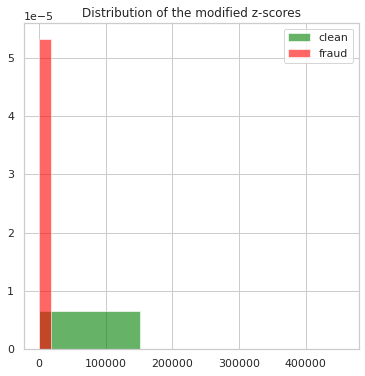

In [ ]:
clean = z_scores[y_test=="NonPEO"]
fraud = z_scores[y_test=="PEO_Master"]

fig, ax = plt.subplots(figsize=(6,6))

ax.hist(clean, bins=3, density=True, label="clean", alpha=.6, color="green")
ax.hist(fraud, bins=3, density=True, label="fraud", alpha=.6, color="red")

plt.title("Distribution of the modified z-scores")
plt.legend()
plt.show()

### <font color='blue'>***One-class SVM***</font>

In [ ]:
paychex.dropna(inplace=True)
features = paychex.columns

X = paychex[features]

le = LabelEncoder()
X['FedDepFreq'] = le.fit_transform(X.FedDepFreq.values)
X['State'] = le.fit_transform(X.State.values)
X['Target'] = le.fit_transform(X.Target.values)
X["Target"].replace({2: 1}, inplace=True)
y = X['Target']

X = X.drop(columns = ['Target','ID'])
X = X[['AvgNbrProduct_Binned','Avg_NetRev_Normalized','Min_NetRev_Normalized']]

# Since KPCA requires a lot of memory space, I took a stratified sample
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=5, stratify=y)

oversample = SMOTE()

X_train, y_train = oversample.fit_resample(X_train, y_train)

# Scale the data to reduce bias for KPCA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
trainedscaler = scaler.fit(X_train)
X_train_scaled = trainedscaler.transform(X_train)
X_test_scaled = trainedscaler.transform(X_test)

# Fitting KPCA with only training data to prevent leakage
from sklearn.decomposition import KernelPCA
kpca = KernelPCA(n_components = 5, n_jobs = -1, kernel = 'rbf')
kpcamodel = kpca.fit(X_train_scaled)
X_train_kpca = kpcamodel.transform(X_train_scaled)
X_test_kpca = kpcamodel.transform(X_test_scaled)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



KeyboardInterrupt: ignored

In [ ]:
# Training model with "majority", leaving [class 1] out
train_final = pd.concat([pd.DataFrame(X_train_kpca), pd.DataFrame(y_train)], axis=1)

train_final.columns = ['0','1','2','3','4','Target']

train_0 = train_final[train_final['Target']==0]
train_0.dropna(inplace=True)
train_0.drop(columns=['Target'], inplace=True)

train_1 = train_final[train_final['Target']==1]
train_1.dropna(inplace=True)
train_1.drop(columns=['Target'], inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning:


A value is try

In [ ]:
# Hyperparameter Tuning (Optuna)

def model_objective(trial):

    # Define search space
    _kernel = trial.suggest_categorical('kernel', ['linear','poly','rbf','sigmoid','precomputed'])
    _gamma = trial.suggest_float("gamma", 0.1, 20)
    _tol = trial.suggest_float("tol", 0.1, 20)
    _nu = trial.suggest_float("nu", 0.1, 1)

    # Define model
    model = OneClassSVM(kernel=_kernel,
                        gamma=_gamma,
                        tol=_tol,
                        nu=_nu,
                        random_state=random_state)

    # Fit model
    model.fit(train_0)

    # Predict binary classes
    y_pred = model.predict(X_test_kpca)
    y_pred = np.where(y_pred==1, 0, -1)
    y_pred = np.where(y_pred==-1, 1, 0)

    #return classification_report(y_true=y_test, y_pred=y_pred)
    #return f1_score(y_true=y_test, y_pred=y_pred, pos_label=1)
    return recall_score(y_true=y_test, y_pred=y_pred, pos_label=1)

[I 2021-11-07 22:50:04,643] A new study created in memory with name: no-name-3a3c9793-b76e-4d32-8b87-760be8e2af39
[W 2021-11-07 22:50:04,649] Trial 0 failed because of the following error: ValueError('X should be a square kernel matrix')
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/optuna/study/_optimize.py", line 213, in _run_trial
    value_or_values = func(trial)
  File "<ipython-input-80-0ebfc886b0ad>", line 20, in model_objective
    scoring="recall"
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 390, in cross_val_score
    error_score=error_score)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 236, in cross_validate
    for train, test in cv.split(X, y, groups))
  File "/usr/local/lib/python3.7/dist-packages/joblib/parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "/usr/local/lib/python3.7/dist-packages/joblib/paralle

ValueError: ignored

In [ ]:
# Study initialization
study = optuna.create_study(direction='maximize')

# Study optimization
study.optimize(model_objective, n_trials=10)

In [ ]:
# Print best parameters and performance
trial = study.best_trial
params = trial.params
best_score = trial.value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {params}\n")

In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
optuna.visualization.plot_slice(study)

In [ ]:
# Rerun model using optimal parameters

# Define model
model = OneClassSVM(**params, 
                    random_state=random_state)

# Fit model
model.fit(train_0)

# Predict binary classes
y_pred = model.predict(X_test_kpca)
y_pred = np.where(y_pred==1, 0, -1)
y_pred = np.where(y_pred==-1, 1, 0)

print(pd.DataFrame(y_pred))

### <font color='blue'>***Isolation Forest***</font>

In [ ]:
paychex.dropna(inplace=True)
features = paychex.columns

X = paychex[features]

le = LabelEncoder()
X['FedDepFreq'] = le.fit_transform(X.FedDepFreq.values)
X['State'] = le.fit_transform(X.State.values)
X['Target'] = le.fit_transform(X.Target.values)
X["Target"].replace({2: 1}, inplace=True)
y = X['Target']

X = X.drop(columns = ['Target','ID'])
X = X[['AvgNbrProduct_Binned','Avg_NetRev_Normalized','Min_NetRev_Normalized']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=5)

oversample = SMOTE()

X_train, y_train = oversample.fit_resample(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



In [ ]:
# Hyperparameter Tuning (Optuna)

def model_objective(trial):

    # Define search space
    _n_estimators = trial.suggest_int("n_estimators", 1, 300)

    # Define model
    model = IsolationForest(n_estimators=_n_estimators, 
                            random_state=random_state)

    # Fit model
    model.fit(X_train)

    # Predict binary classes
    y_pred = model.predict(X_test)
    y_pred = np.where(y_pred==1, 0, -1)
    y_pred = np.where(y_pred==-1, 1, 0)

    #return classification_report(y_true=y_test, y_pred=y_pred)
    #return f1_score(y_true=y_test, y_pred=y_pred, pos_label=1)
    return recall_score(y_true=y_test, y_pred=y_pred, pos_label=1)

In [ ]:
# Study initialization
study = optuna.create_study(direction='maximize')

# Study optimization
study.optimize(model_objective, n_trials=10)

[I 2021-11-08 18:38:51,214] A new study created in memory with name: no-name-ff1a80f7-a891-49aa-9590-d5b88e511f10
[I 2021-11-08 18:38:51,589] Trial 0 finished with value: 0.2398843930635838 and parameters: {'n_estimators': 37}. Best is trial 0 with value: 0.2398843930635838.
[I 2021-11-08 18:38:53,403] Trial 1 finished with value: 0.2928709055876686 and parameters: {'n_estimators': 186}. Best is trial 1 with value: 0.2928709055876686.
[I 2021-11-08 18:38:55,901] Trial 2 finished with value: 0.2649325626204239 and parameters: {'n_estimators': 259}. Best is trial 1 with value: 0.2928709055876686.
[I 2021-11-08 18:38:55,966] Trial 3 finished with value: 0.2774566473988439 and parameters: {'n_estimators': 5}. Best is trial 1 with value: 0.2928709055876686.
[I 2021-11-08 18:38:56,433] Trial 4 finished with value: 0.22254335260115607 and parameters: {'n_estimators': 48}. Best is trial 1 with value: 0.2928709055876686.
[I 2021-11-08 18:38:58,976] Trial 5 finished with value: 0.243737957610789

In [ ]:
# Print best parameters and performance
trial = study.best_trial
params = trial.params
best_score = trial.value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {params}\n")

Best score: 0.2976878612716763

Optimized parameters: {'n_estimators': 98}



In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
optuna.visualization.plot_slice(study)

In [ ]:
# Rerun model using optimal parameters

# Define model
model = IsolationForest(**params, 
                        random_state=random_state)

# Fit model
model.fit(X_train)

# Predict binary classes
y_pred = model.predict(X_test)
y_pred = np.where(y_pred==1, 0, -1)
y_pred = np.where(y_pred==-1, 1, 0)

print(pd.DataFrame(y_pred))

       0
0      1
1      0
2      0
3      1
4      0
...   ..
21055  0
21056  0
21057  0
21058  1
21059  0

[21060 rows x 1 columns]


## <font color='red'>***Model Building - Sequential Framework***</font>

### <font color='blue'>***Sequential Models***</font>


In [ ]:
#split the dataset in 2
features = paychex.columns

X = paychex[features]

y = X['Target']
classes = {'NonPEO':0, 'PEO_Master':1, 'PEO_NonMaster':2}
y = y.map(classes.get)
y.replace({2: 1}, inplace=True)


X = X.drop(columns = ['Target','ID','State', 'FedDepFreq'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=40,stratify=y)


scaler = StandardScaler()
scaled = scaler.fit(X_train)
X_train=scaled.transform(X_train)
X_test=scaled.transform(X_test)

model = LogisticRegression(solver='liblinear', random_state=0,dual=False,max_iter=10000)
model.fit(X_train, y_train)
Y_pred = model.predict(X_test)

report = classification_report(y_true=y_test, y_pred=Y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     12000
           1       0.83      0.55      0.66       636

    accuracy                           0.97     12636
   macro avg       0.90      0.77      0.82     12636
weighted avg       0.97      0.97      0.97     12636



In [ ]:
second_df = paychex[paychex['Target'] != 'NonPEO']

features = second_df.columns
X = second_df[features]

y = X['Target']

X = X.drop(columns = ['Target','ID','State', 'FedDepFreq'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=40,stratify=y)
'''
le = LabelEncoder()

le1 = le.fit(X_train.FedDepFreq)
X_train['FedDepFreq']=le1.transform(X_train['FedDepFreq'])
X_test['FedDepFreq']=le1.transform(X_test['FedDepFreq'])

le2 = le.fit(X_train.State)
X_train['State']=le2.transform(X_train['State'])
X_test['State']=le2.transform(X_test['State'])
'''
scaler = StandardScaler()
scaled = scaler.fit(X_train)
X_train=scaled.transform(X_train)
X_test=scaled.transform(X_test)

model = LogisticRegression(solver='liblinear', random_state=0,dual=False,max_iter=10000)
model.fit(X_train, y_train)
Y_pred = model.predict(X_test)

report = classification_report(y_true=y_test, y_pred=Y_pred)
print(report)

               precision    recall  f1-score   support

   PEO_Master       0.47      0.10      0.16       144
PEO_NonMaster       0.79      0.97      0.87       492

     accuracy                           0.77       636
    macro avg       0.63      0.53      0.51       636
 weighted avg       0.71      0.77      0.71       636



In [ ]:
curiosity = paychex[paychex['Target'] != 'PEO_NonMaster']

features = curiosity.columns
X = curiosity[features]

y = X['Target']

X = X.drop(columns = ['Target','ID','State', 'FedDepFreq'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=40,stratify=y)
'''
le = LabelEncoder()

le1 = le.fit(X_train.FedDepFreq)
X_train['FedDepFreq']=le1.transform(X_train['FedDepFreq'])
X_test['FedDepFreq']=le1.transform(X_test['FedDepFreq'])

le2 = le.fit(X_train.State)
X_train['State']=le2.transform(X_train['State'])
X_test['State']=le2.transform(X_test['State'])
'''
scaler = StandardScaler()
scaled = scaler.fit(X_train)
X_train=scaled.transform(X_train)
X_test=scaled.transform(X_test)

model = LogisticRegression(solver='liblinear', random_state=0,dual=False,max_iter=10000)
model.fit(X_train, y_train)
Y_pred = model.predict(X_test)

report = classification_report(y_true=y_test, y_pred=Y_pred)
print(report)

              precision    recall  f1-score   support

      NonPEO       0.99      1.00      0.99     12000
  PEO_Master       0.51      0.15      0.24       144

    accuracy                           0.99     12144
   macro avg       0.75      0.58      0.61     12144
weighted avg       0.98      0.99      0.99     12144

